# Predicting COVID-19 Mortality Rate with Nutrition: A Data Science Project
## Project Overview

- **Version 0.1 CovidAI**
-**Supervisor**: Dr.Alma Rahat
-**Student**   :Abdullah Sharaf

-This project aims to develop a robust regression model to predict the COVID-19 mortality rate using machine learning techniques.

## Features Summary

- **Country**: The name of the country.
beverages.
- **Animal Products**: Consumption of animal products.
- **Animal fats**: Consumption of animal fats.
- **Cereals - Excluding Beer**: Consumption of cereals, excluding beer.
- **Eggs**: Consumption of eggs.
- **Fish, Seafood**: Consumption of fish and seafood.
- **Fruits - Excluding Wine**: Consumption of fruits, excluding wine.
- **Meat**: Consumption of meat.
- **Milk - Excluding Butter**: Consumption of milk, excluding butter.
- **Miscellaneous**: Consumption of miscellaneous food items.
- **Offals**: Consumption of offals.
- **Oilcrops**: Consumption of oil crops.
- **Pulses**: Consumption of pulses
- **Spices**: Consumption of spices.
- **Starchy Roots**: Consumption of starchy roots.
- **Stimulants**: Consumption of stimulants.
- **Sugar & Sweeteners**: Consumption of sugar and sweeteners.
- **Treenuts**: Consumption of tree nuts.
- **Vegetal Products**: Consumption of vegetal products.
- **Vegetable Oils**: Consumption of vegetable oils.
- **Death rate**: Accumulated death number as a percentage of the population.


**Regression Models we will apply**

## 1. Data Exploration and Preprocessing

#### Import Libraries

In [3]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=59419f9fea32e9c8bd765e7c11517ed7904dc6ba5d67328fbe7b3e2b75c8a082
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import uniform, randint, spearmanr, pearsonr
import statsmodels.api as sm
import joblib
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV, train_test_split, KFold, cross_val_score,
                                     cross_val_predict, learning_curve)
from sklearn.preprocessing import (StandardScaler, MinMaxScaler, PowerTransformer, PolynomialFeatures)
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA, KernelPCA
from sklearn.feature_selection import (SelectKBest, f_regression, mutual_info_regression, RFE, VarianceThreshold)
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import (mean_absolute_error, mean_squared_error, r2_score, explained_variance_score)
from sklearn.pipeline import Pipeline
import lime
from scipy import stats
from lime.lime_tabular import LimeTabularExplainer
from yellowbrick.regressor import PredictionError, ResidualsPlot
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import warnings
import io
from google.colab import files
from sklearn.feature_selection import SelectFromModel
from IPython.core.display import display, HTML


#### Load and Explore Dataset

In [5]:
# Upload the file
uploaded = files.upload()
# Assuming the file you uploaded is 'Covid_Death.csv'
filename = list(uploaded.keys())[0]
# Read the uploaded file into a pandas DataFrame
df_raw = pd.read_csv(io.BytesIO(uploaded[filename]))
# Display the first few rows of the DataFrame
df_raw.head(5)

Saving Death_Nutrition_.csv to Death_Nutrition_.csv


,Country,Animal fats,Animal Products,Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,...,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Treenuts,Vegetable Oils,Vegetal Products,Death rate
0,Afghanistan,0.1973,9.4341,24.8097,0.2099,0.0350,5.3495,1.2020,7.5828,0.0728,...,0.0700,0.2953,0.0574,0.8802,0.3078,1.3489,0.0770,0.5345,40.5645,0.006186
1,Albania,0.1357,18.7684,5.7817,0.5815,0.2126,6.7861,1.8845,15.7213,0.1123,...,0.9377,0.2380,0.0008,1.8096,0.1055,1.5367,0.1515,0.3261,31.2304,0.050951
2,Algeria,0.0282,9.6334,13.6816,0.5277,0.2416,6.3801,1.1305,7.6189,0.1671,...,0.3493,0.4783,0.0557,4.1340,0.2216,1.8342,0.1152,1.0310,40.3651,0.006558
3,Angola,0.0560,4.9278,9.1085,0.0587,1.7707,6.0005,2.0571,0.8311,0.1165,...,0.4186,0.6507,0.0009,18.1102,0.0508,1.8495,0.0061,0.6463,45.0722,0.001461
4,Antigua and Barbuda,0.0087,16.6613,5.9960,0.2274,4.1489,10.7451,5.6888,6.3663,0.7139,...,0.2172,0.1840,0.1524,1.4522,0.1564,3.8749,0.0253,0.8102,33.3233,0.007143


In [6]:
df_raw.keys()

Index(['Country', 'Animal fats', 'Animal Products', 'Cereals - Excluding Beer',
       'Eggs', 'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat',
       'Milk - Excluding Butter', 'Miscellaneous', 'Offals', 'Oilcrops',
       'Pulses', 'Spices', 'Starchy Roots', 'Stimulants', 'Sugar & Sweeteners',
       'Treenuts', 'Vegetable Oils', 'Vegetal Products', 'Death rate'],
      dtype='object')

In [7]:
df_raw.shape

(170, 21)

In [8]:
df_raw.dtypes.value_counts()

,count
float64,20
object,1


In [9]:
df_raw.tail()

,Country,Animal fats,Animal Products,Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,...,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Treenuts,Vegetable Oils,Vegetal Products,Death rate
165,Venezuela (Bolivarian Republic of),0.0403,14.7565,12.9253,0.3389,0.9456,7.6460,3.8328,9.3920,0.0702,...,0.0281,0.3342,0.0009,2.5643,0.1479,3.4106,0.0009,1.3734,35.2416,0.004287
166,Vietnam,0.1640,8.5765,16.8740,0.3077,2.6392,5.9029,4.4382,0.6069,0.0126,...,0.8410,0.2032,0.2074,1.0596,0.2880,1.2846,0.3070,0.2201,41.4232,0.000036
167,Yemen,0.0446,5.7874,27.2077,0.2579,0.5240,5.1344,2.7871,1.8911,0.2033,...,0.0893,0.8645,0.0347,1.0794,0.2199,5.0468,0.0017,1.0811,44.2126,0.002062
168,Zambia,0.0829,6.0197,21.1938,0.3399,1.6924,1.0183,1.8427,1.7570,0.2149,...,1.8736,0.1756,0.0478,7.9649,0.0618,1.5632,0.0014,0.6657,43.9789,0.004564
169,Zimbabwe,0.0755,8.1489,22.6240,0.2678,0.5518,2.2000,2.6142,4.4310,0.2012,...,0.4498,0.4261,0.0252,2.9870,0.1494,4.6485,0.0518,1.7103,41.8526,0.008854


In [10]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   170 non-null    object 
 1   Animal fats               170 non-null    float64
 2   Animal Products           170 non-null    float64
 3   Cereals - Excluding Beer  170 non-null    float64
 4   Eggs                      170 non-null    float64
 5   Fish, Seafood             170 non-null    float64
 6   Fruits - Excluding Wine   170 non-null    float64
 7   Meat                      170 non-null    float64
 8   Milk - Excluding Butter   170 non-null    float64
 9   Miscellaneous             170 non-null    float64
 10  Offals                    170 non-null    float64
 11  Oilcrops                  170 non-null    float64
 12  Pulses                    170 non-null    float64
 13  Spices                    170 non-null    float64
 14  Starchy Ro

In [11]:
# Save the 'Country' column
country_column_before_cleaned = df_raw['Country']

# Drop the 'Country' column
df_raw_without_countries = df_raw.drop(columns=['Country'])

# Convert other columns to numeric and handle errors
df_country_raw_numeric = df_raw_without_countries.apply(pd.to_numeric, errors='coerce').astype('float64')

# Insert the 'Country' column back as the first column
df_country_raw_numeric.insert(0, 'Country', country_column_before_cleaned)

In [12]:
country_column_before_cleaned

,Country
0,Afghanistan
1,Albania
2,Algeria
3,Angola
4,Antigua and Barbuda
...,...
165,Venezuela (Bolivarian Republic of)
166,Vietnam
167,Yemen
168,Zambia


In [13]:
df_country_raw_numeric

,Country,Animal fats,Animal Products,Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,...,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Treenuts,Vegetable Oils,Vegetal Products,Death rate
0,Afghanistan,0.1973,9.4341,24.8097,0.2099,0.0350,5.3495,1.2020,7.5828,0.0728,...,0.0700,0.2953,0.0574,0.8802,0.3078,1.3489,0.0770,0.5345,40.5645,0.006186
1,Albania,0.1357,18.7684,5.7817,0.5815,0.2126,6.7861,1.8845,15.7213,0.1123,...,0.9377,0.2380,0.0008,1.8096,0.1055,1.5367,0.1515,0.3261,31.2304,0.050951
2,Algeria,0.0282,9.6334,13.6816,0.5277,0.2416,6.3801,1.1305,7.6189,0.1671,...,0.3493,0.4783,0.0557,4.1340,0.2216,1.8342,0.1152,1.0310,40.3651,0.006558
3,Angola,0.0560,4.9278,9.1085,0.0587,1.7707,6.0005,2.0571,0.8311,0.1165,...,0.4186,0.6507,0.0009,18.1102,0.0508,1.8495,0.0061,0.6463,45.0722,0.001461
4,Antigua and Barbuda,0.0087,16.6613,5.9960,0.2274,4.1489,10.7451,5.6888,6.3663,0.7139,...,0.2172,0.1840,0.1524,1.4522,0.1564,3.8749,0.0253,0.8102,33.3233,0.007143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,Venezuela (Bolivarian Republic of),0.0403,14.7565,12.9253,0.3389,0.9456,7.6460,3.8328,9.3920,0.0702,...,0.0281,0.3342,0.0009,2.5643,0.1479,3.4106,0.0009,1.3734,35.2416,0.004287
166,Vietnam,0.1640,8.5765,16.8740,0.3077,2.6392,5.9029,4.4382,0.6069,0.0126,...,0.8410,0.2032,0.2074,1.0596,0.2880,1.2846,0.3070,0.2201,41.4232,0.000036
167,Yemen,0.0446,5.7874,27.2077,0.2579,0.5240,5.1344,2.7871,1.8911,0.2033,...,0.0893,0.8645,0.0347,1.0794,0.2199,5.0468,0.0017,1.0811,44.2126,0.002062
168,Zambia,0.0829,6.0197,21.1938,0.3399,1.6924,1.0183,1.8427,1.7570,0.2149,...,1.8736,0.1756,0.0478,7.9649,0.0618,1.5632,0.0014,0.6657,43.9789,0.004564


In [14]:
df_country_raw_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   170 non-null    object 
 1   Animal fats               170 non-null    float64
 2   Animal Products           170 non-null    float64
 3   Cereals - Excluding Beer  170 non-null    float64
 4   Eggs                      170 non-null    float64
 5   Fish, Seafood             170 non-null    float64
 6   Fruits - Excluding Wine   170 non-null    float64
 7   Meat                      170 non-null    float64
 8   Milk - Excluding Butter   170 non-null    float64
 9   Miscellaneous             170 non-null    float64
 10  Offals                    170 non-null    float64
 11  Oilcrops                  170 non-null    float64
 12  Pulses                    170 non-null    float64
 13  Spices                    170 non-null    float64
 14  Starchy Ro

#### Handle Missing Values

In [15]:
# function to count missing data and in which feature.
def missing_data(data):
    nb_values = data.isnull().sum().sort_values(ascending = False) #contains the number of values missing
    percent_values = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False) #contains the percentage of values missing
    return pd.concat([nb_values, percent_values], axis=1, keys=['Number of Missing Values', 'Percentage of Missing Values'])
missing_data(df_country_raw_numeric).head(5)

,Number of Missing Values,Percentage of Missing Values
Death rate,6,3.529412
Animal fats,0,0.000000
Animal Products,0,0.000000
Cereals - Excluding Beer,0,0.000000
Country,0,0.000000


In [16]:
# drop miss values
df_clened_missValues = df_country_raw_numeric.dropna()

In [17]:
missing_data(df_clened_missValues).head(5)

,Number of Missing Values,Percentage of Missing Values
Country,0,0.0
Animal fats,0,0.0
Animal Products,0,0.0
Cereals - Excluding Beer,0,0.0
Eggs,0,0.0


#### Handling Douplicate Data

In [18]:
#Show Duplicates
duplicates = df_clened_missValues.duplicated()
print(duplicates)

0      False
1      False
2      False
3      False
4      False
       ...  
165    False
166    False
167    False
168    False
169    False
Length: 164, dtype: bool


In [19]:
# there are no duplicates rows
duplicate_rows = df_clened_missValues[df_clened_missValues.duplicated()]
print(duplicate_rows)

Empty DataFrame
Columns: [Country, Animal fats, Animal Products, Cereals - Excluding Beer, Eggs, Fish, Seafood, Fruits - Excluding Wine, Meat, Milk - Excluding Butter, Miscellaneous, Offals, Oilcrops, Pulses, Spices, Starchy Roots, Stimulants, Sugar & Sweeteners, Treenuts, Vegetable Oils, Vegetal Products, Death rate]
Index: []

[0 rows x 21 columns]


#### Scaling Data:

In [20]:
# Save the 'Country' column
country_column = df_clened_missValues['Country']

# Drop the 'Country' column to use data for ML
df_cleaned = df_clened_missValues.drop(columns=['Country'])

# Separate features (X) and target (y) to avoid leakage
X = df_cleaned.iloc[:, :-1].values
y = df_cleaned.iloc[:, -1].values
y = y.reshape(len(y), 1)

# Split data into training and test sets to avoid leakage data problem to use with ML and feture selection.
X_train, X_test, y_train, y_test, countries_train, countries_test = train_test_split(
    X, y, country_column, test_size=0.2, random_state=1)

# Standardize for use in ML ( X and y using only training data )
sc_XS = StandardScaler()
sc_ys = StandardScaler()

X_train_scaled = sc_XS.fit_transform(X_train)
y_train_scaled = sc_ys.fit_transform(y_train)
X_test_scaled = sc_XS.transform(X_test)
y_test_scaled = sc_ys.transform(y_test)






In [21]:
# Combine scaled X and y back into training and test dataframes to use in XAI
columns_without_target = df_cleaned.columns[:-1]  # Exclude the last column (target)
Target = df_cleaned.columns[-1]                   # Last column is the target
df_train_standrized = pd.DataFrame(np.hstack((X_train_scaled, y_train_scaled)), columns=list(columns_without_target) + ['Death rate'])
df_test_standrized = pd.DataFrame(np.hstack((X_test_scaled, y_test_scaled)), columns=list(columns_without_target) + ['Death rate'])

# Add the 'Country' column back to both training and test sets
df_train_standrized['Country'] = countries_train.reset_index(drop=True)
df_test_standrized['Country'] = countries_test.reset_index(drop=True)

# Reorder the columns to make 'Country' the first column
df_train_standrized = df_train_standrized[['Country'] + [col for col in df_train_standrized.columns if col != 'Country']]
df_test_standrized = df_test_standrized[['Country'] + [col for col in df_test_standrized.columns if col != 'Country']]

# Combine the standardized training and test dataframes will use in XAI
df_combined = pd.concat([df_train_standrized, df_test_standrized], ignore_index=True)
df_combined .sort_values(by='Death rate',ascending=False, inplace=True)
df_combined_without_countries = df_combined.drop(columns=['Country'])
df_combined_with_countries = df_combined.copy()



In [22]:
df_test_standrized.shape

(33, 21)

In [23]:
df_train_standrized.shape

(131, 21)

In [24]:
Independent_features =  df_train_standrized.drop(columns=['Death rate','Country']).columns
print(Independent_features)

print(f"Number of Dependent features after removing Country, Death rate and population at begining: {len(Independent_features)}")

Index(['Animal fats', 'Animal Products', 'Cereals - Excluding Beer', 'Eggs',
       'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat',
       'Milk - Excluding Butter', 'Miscellaneous', 'Offals', 'Oilcrops',
       'Pulses', 'Spices', 'Starchy Roots', 'Stimulants', 'Sugar & Sweeteners',
       'Treenuts', 'Vegetable Oils', 'Vegetal Products'],
      dtype='object')
Number of Dependent features after removing Country, Death rate and population at begining: 19


## Exploratory Data Analysis (EDA)

#### Descriptive Statistics: Compute summary statistics for numerical features.

In [25]:
# df_train_standrized summary statistics
df_train_standrized.describe().round(2)


,Animal fats,Animal Products,Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,Offals,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Treenuts,Vegetable Oils,Vegetal Products,Death rate
count,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00,131.00
mean,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-0.79,-1.76,-1.42,-1.33,-1.09,-1.61,-1.72,-1.25,-0.65,-1.14,-0.46,-0.89,-0.76,-0.82,-1.15,-1.58,-0.81,-1.54,-2.51,-0.78
25%,-0.67,-0.85,-0.79,-0.85,-0.66,-0.65,-0.81,-0.89,-0.59,-0.51,-0.38,-0.66,-0.63,-0.59,-0.67,-0.69,-0.69,-0.81,-0.77,-0.75
50%,-0.35,-0.01,-0.26,-0.08,-0.27,-0.18,0.05,-0.23,-0.35,-0.20,-0.27,-0.38,-0.42,-0.42,-0.19,-0.13,-0.27,-0.14,0.01,-0.54
75%,0.14,0.77,0.49,0.50,0.39,0.37,0.56,0.76,0.16,0.16,-0.06,0.31,0.22,0.11,0.42,0.54,0.22,0.60,0.85,0.43
max,4.19,2.51,2.82,3.45,6.07,4.03,2.67,2.88,5.06,6.00,6.34,4.63,4.40,3.74,4.99,4.77,4.31,2.63,1.76,2.85


In [26]:
# df_test_standrized summry statistic
df_test_standrized.describe().round(2)


,Animal fats,Animal Products,Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,Offals,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Treenuts,Vegetable Oils,Vegetal Products,Death rate
count,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00,33.00
mean,0.15,0.11,0.36,-0.25,-0.14,-0.51,-0.22,0.26,-0.07,-0.01,-0.26,-0.18,-0.18,-0.11,0.37,0.40,-0.06,-0.21,-0.11,0.25
std,1.16,1.01,1.17,0.74,0.85,0.69,0.88,0.98,0.72,0.64,0.34,0.74,0.73,0.72,1.65,1.18,0.99,1.01,1.01,1.12
min,-0.77,-1.41,-1.29,-1.19,-1.02,-1.55,-1.69,-1.24,-0.65,-1.04,-0.46,-0.89,-0.73,-0.79,-1.15,-1.44,-0.81,-1.75,-2.02,-0.78
25%,-0.50,-0.79,-0.62,-0.94,-0.68,-0.92,-0.91,-0.56,-0.62,-0.54,-0.42,-0.71,-0.62,-0.58,-0.65,-0.60,-0.63,-0.91,-0.76,-0.68
50%,-0.38,0.18,0.08,-0.37,-0.41,-0.65,-0.41,0.22,-0.44,0.01,-0.36,-0.46,-0.39,-0.38,0.09,0.33,-0.23,-0.46,-0.18,-0.47
75%,0.07,0.76,1.10,0.19,0.18,-0.23,0.35,0.93,0.47,0.36,-0.27,0.23,-0.23,-0.03,0.48,1.10,-0.04,0.18,0.79,1.19
max,3.77,2.02,3.28,1.46,2.65,1.62,2.04,2.64,1.85,1.45,1.30,1.88,2.71,2.40,6.64,3.67,3.53,2.97,1.41,3.14


#### Distribution

In [27]:
# Histograms distribution
rows = 5
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(80, 80))

col = df_combined_without_countries.columns
index = 0

for i in range(rows):
    for j in range(cols):
        if index >= len(col):
            break
        sns.histplot(df_combined_without_countries[col[index]], ax=ax[i][j], kde=True)
        ax[i][j].set_title(col[index], fontsize=100)
        ax[i][j].tick_params(axis='both', labelsize=70)
        index += 1

plt.tight_layout()
plt.show()


- Nutrition Fetures VS Death rate (check linearity)

Checking assumptions for feature: Animal fats


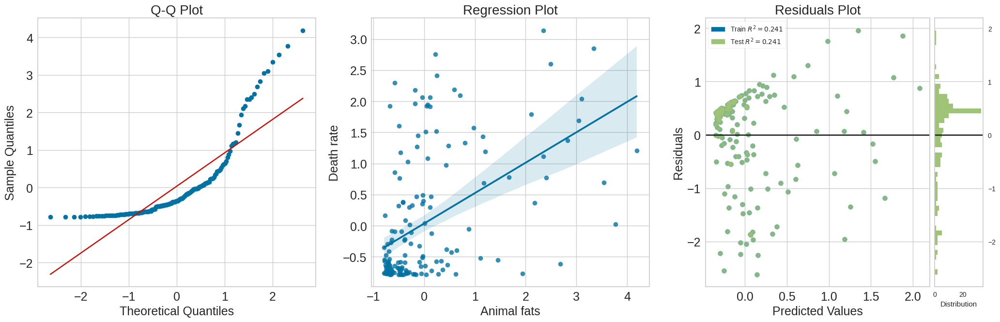

Checking assumptions for feature: Animal Products


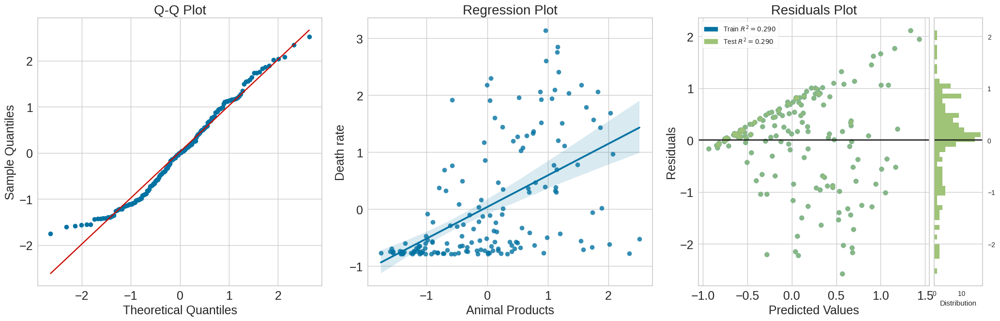

Checking assumptions for feature: Cereals - Excluding Beer


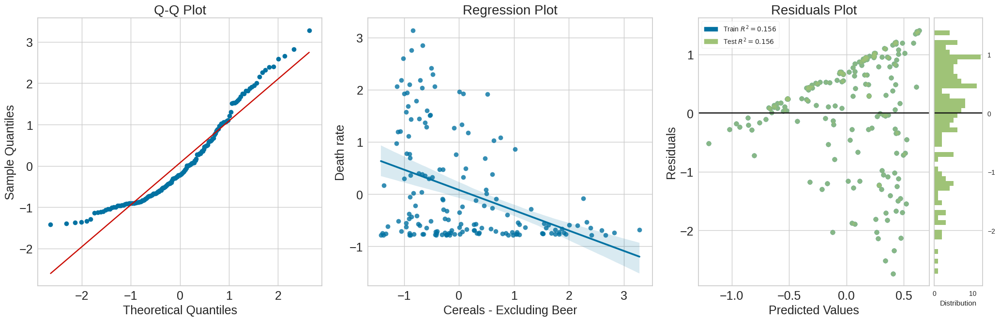

Checking assumptions for feature: Eggs


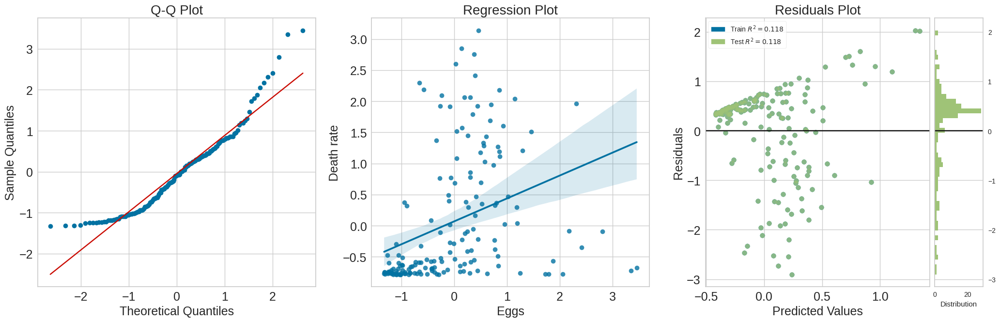

Checking assumptions for feature: Fish, Seafood


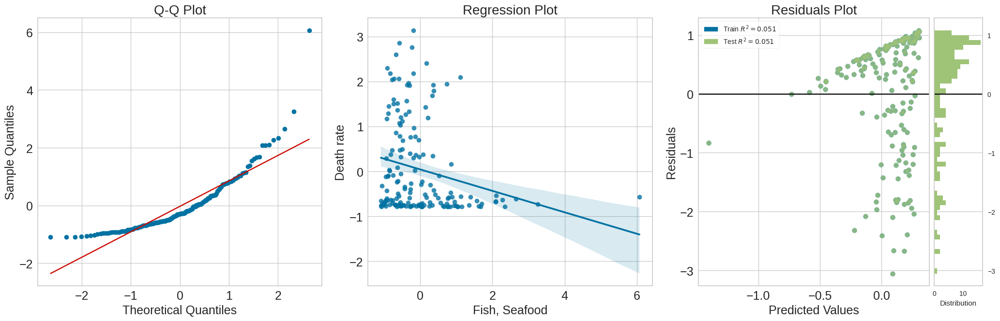

Checking assumptions for feature: Fruits - Excluding Wine


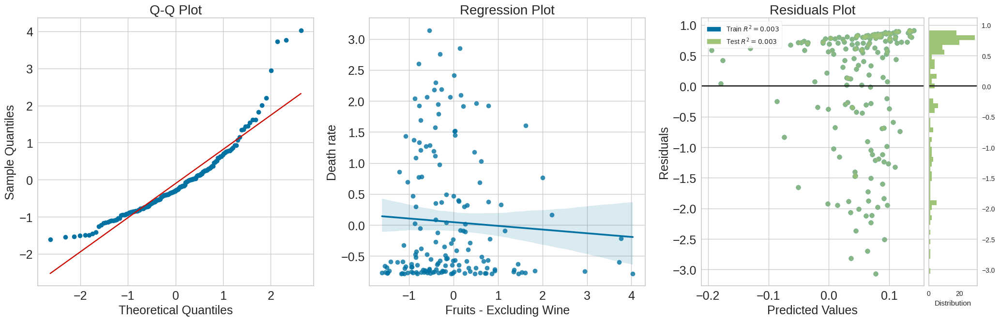

Checking assumptions for feature: Meat


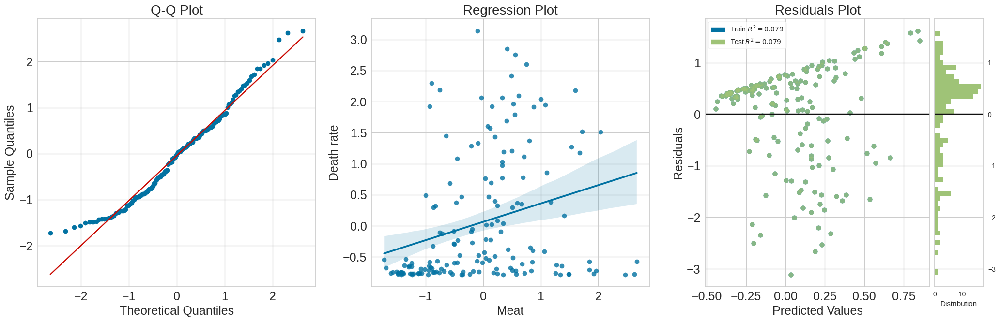

Checking assumptions for feature: Milk - Excluding Butter


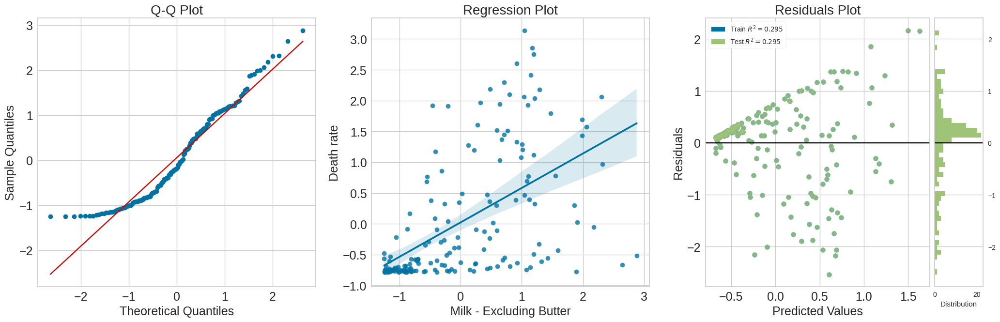

Checking assumptions for feature: Miscellaneous


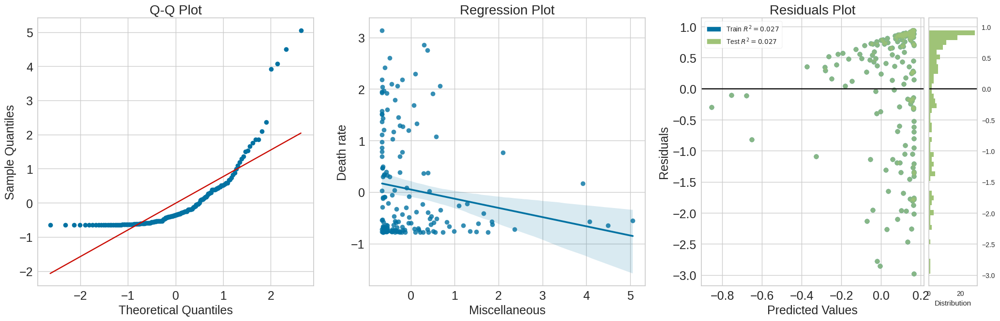

Checking assumptions for feature: Offals


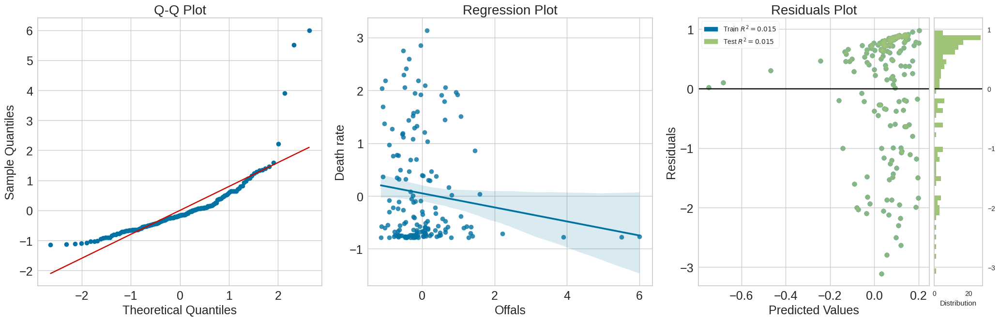

Checking assumptions for feature: Oilcrops


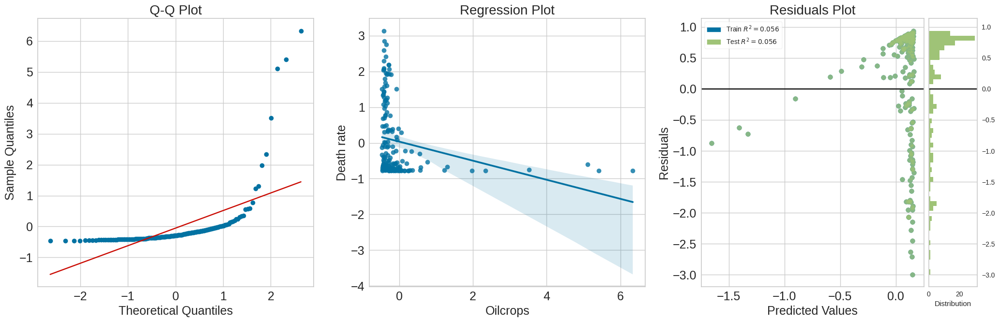

Checking assumptions for feature: Pulses


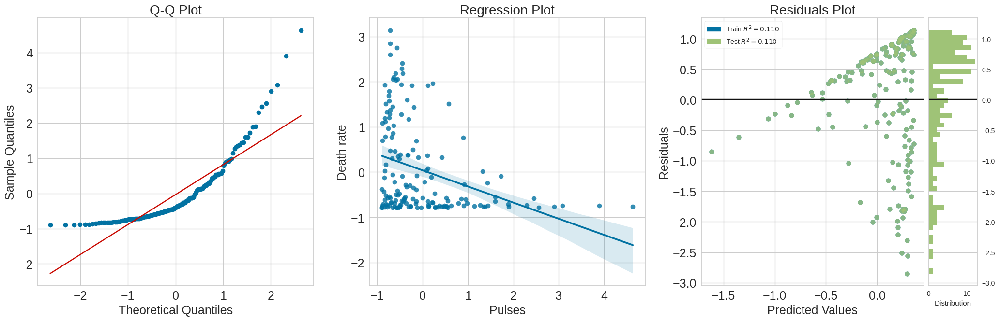

Checking assumptions for feature: Spices


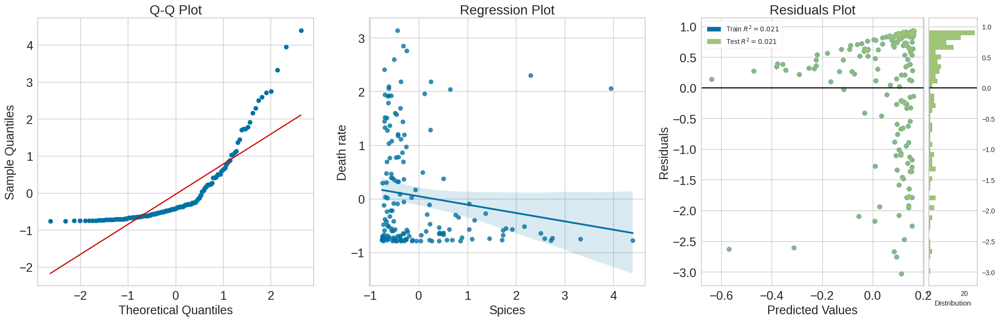

Checking assumptions for feature: Starchy Roots


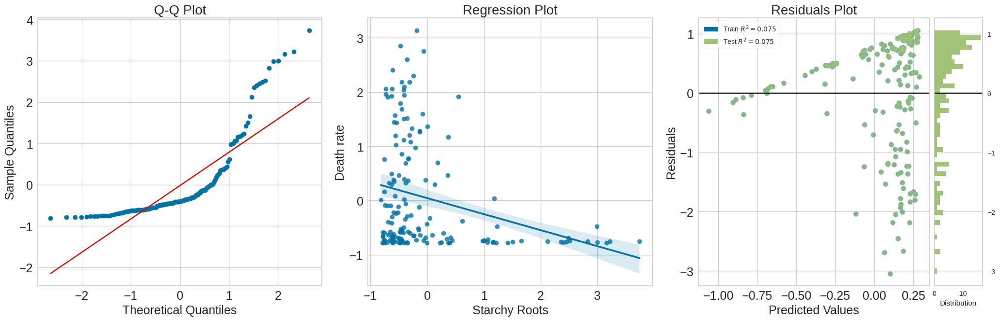

Checking assumptions for feature: Stimulants


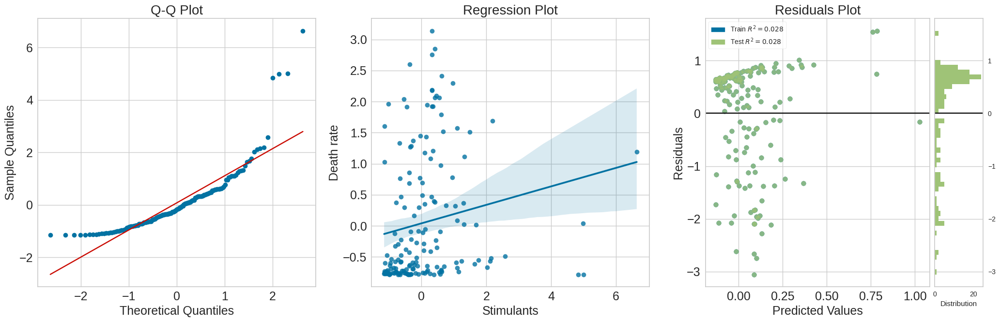

Checking assumptions for feature: Sugar & Sweeteners


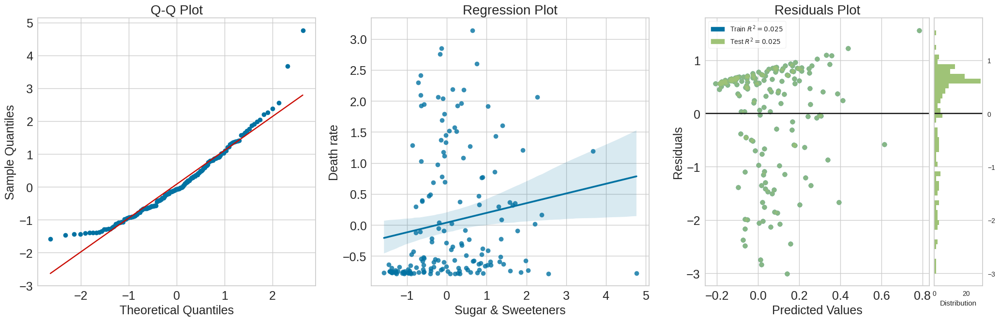

Checking assumptions for feature: Treenuts


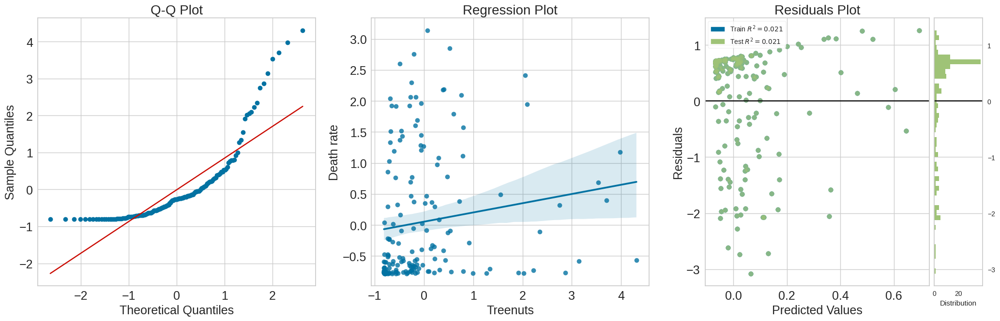

Checking assumptions for feature: Vegetable Oils


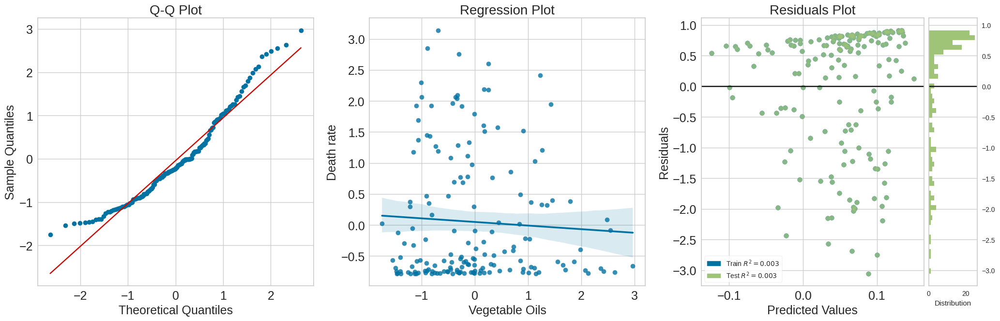

Checking assumptions for feature: Vegetal Products


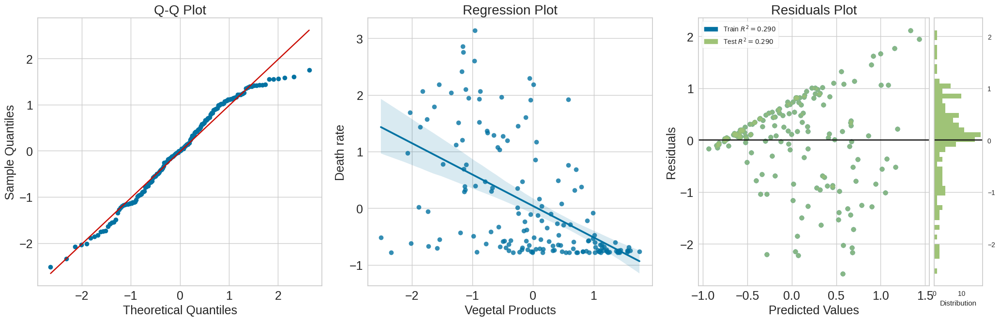

In [28]:
# check linearity or not
def check_linear_model_assumptions(df, variable):
    plt.rcParams.update({'font.size': 18})

    fig, axs = plt.subplots(1, 3, figsize=(21, 7))

    # Plot Q-Q plot
    stats.probplot(df[variable], dist='norm', plot=axs[0])
    axs[0].set_title('Q-Q Plot', fontsize=20)
    axs[0].set_xlabel('Theoretical Quantiles', fontsize=18)
    axs[0].set_ylabel('Sample Quantiles', fontsize=18)
    axs[0].tick_params(axis='both', labelsize=18)

    # Plot regression line
    sns.regplot(x=variable, y='Death rate', data=df, order=1, ax=axs[1])
    axs[1].set_title('Regression Plot', fontsize=20)
    axs[1].set_xlabel(variable, fontsize=18)
    axs[1].set_ylabel('Death rate', fontsize=18)
    axs[1].tick_params(axis='both', labelsize=18)

    # Perform 5-fold cross-validation and plot residuals
    X = df[[variable]]
    y = df['Death rate']

    model = LinearRegression()
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    predictions = cross_val_predict(model, X, y, cv=kf)

    visualizer = ResidualsPlot(model, ax=axs[2])
    visualizer.fit(X, y)  # Fit the training data to the model
    visualizer.score(X, y)  # Evaluate the model on the cross-validated predictions
    visualizer.finalize()

    axs[2].set_title('Residuals Plot', fontsize=20)
    axs[2].set_xlabel('Predicted Values', fontsize=18)
    axs[2].set_ylabel('Residuals', fontsize=18)
    axs[2].tick_params(axis='both', labelsize=18)

    plt.tight_layout()
    plt.show()

# Loop to call the function for each feature
for feature in Independent_features:
    print(f"Checking assumptions for feature: {feature}")
    check_linear_model_assumptions(df_combined_without_countries, feature)


## Feature Selection
- Feature Selection Techniques for Non-Linear Problems

Feature selection suitable for non-linear problem:
- **Filter Method**- you filter and take only the subset of the relevant features.
- **Wrapper Method**- you feed the features to the selected Machine Learning algorithm and based on the model performance you add/remove the features.


### Filter Method

#### Variance Threshold

In [29]:
# Set a variance threshold.
threshold = 0.01
selector = VarianceThreshold(threshold=threshold)

# Fit the selector to the data
X_train_filtered = selector.fit_transform(df_train_standrized[Independent_features])

# Get the mask of selected features
selected_features_mask = selector.get_support()

# Get the names of the selected features
selected_feature_names_VT = df_train_standrized[Independent_features].columns[selected_features_mask]

# Print the selected feature names
print("Selected Feature Names:", selected_feature_names_VT)
print("Number of Selected Features:", len(selected_feature_names_VT))


Selected Feature Names: Index(['Animal fats', 'Animal Products', 'Cereals - Excluding Beer', 'Eggs',
       'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat',
       'Milk - Excluding Butter', 'Miscellaneous', 'Offals', 'Oilcrops',
       'Pulses', 'Spices', 'Starchy Roots', 'Stimulants', 'Sugar & Sweeteners',
       'Treenuts', 'Vegetable Oils', 'Vegetal Products'],
      dtype='object')
Number of Selected Features: 19


#### Mutual Information
- Measures the dependency between each feature and the target variable. It’s particularly useful in capturing non-linear relationships.

In [30]:
# we used feature selection from Variance threshold fom above as input
# Apply Mutual Information
mutual_info_scaled = mutual_info_regression(df_train_standrized[selected_feature_names_VT], df_train_standrized[Target])

# Create a DataFrame to display the scores
mutual_info_df_scaled = pd.DataFrame({
    'Feature': selected_feature_names_VT,
    'Mutual Information Score': mutual_info_scaled
}).sort_values(by='Mutual Information Score', ascending=False)

# Define a range of MI thresholds to test
mi_thresholds = np.arange(0.01, 0.25, 0.01)

# Initialize variables to store the best model and threshold
best_threshold = 0
best_score = float('inf')
best_model = None
best_kept_features_list_MI = None  # To store the best kept features list

# Iterate through each MI threshold
for threshold in mi_thresholds:
    # Select features based on the current threshold
    kept_features = mutual_info_df_scaled[mutual_info_df_scaled['Mutual Information Score'] > threshold]
    kept_features_list_MI = kept_features['Feature'].tolist()

    # Subset the training and test data with the selected features
    X_train_subset = df_train_standrized[kept_features_list_MI]
    X_test_subset = df_test_standrized[kept_features_list_MI]

    # Define the SVR model with a nonlinear kernel
    svr = SVR(kernel='rbf')  # Radial Basis Function kernel as an example

    # Train the model on the training subset
    svr.fit(X_train_subset, y_train_scaled)

    # Predict on the test set
    y_pred = svr.predict(X_test_subset)

    # Evaluate the model's performance
    mse = mean_squared_error(y_test_scaled, y_pred)
    rmse = np.sqrt(mse)  # Calculate RMSE


    # Update the best model if the current model has a lower RMSE
    if rmse < best_score:
        best_score = rmse
        best_threshold = threshold
        best_model = svr
        best_kept_features_list_MI = kept_features_list_MI  # Store the best features list

# Output the best threshold and the corresponding feature list
print(f"Best MI Threshold: {best_threshold}")
print(f"Best RMSE: {best_score}")
print(f"Number of Kept Features: {len(best_kept_features_list_MI)}")
print(f"Kept Features List: {best_kept_features_list_MI}")


Best MI Threshold: 0.060000000000000005
Best RMSE: 0.8897168215906434
Number of Kept Features: 13
Kept Features List: ['Milk - Excluding Butter', 'Vegetal Products', 'Animal Products', 'Eggs', 'Animal fats', 'Cereals - Excluding Beer', 'Meat', 'Fish, Seafood', 'Sugar & Sweeteners', 'Starchy Roots', 'Offals', 'Oilcrops', 'Pulses']


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

### Wrapper Method

#### Recursive Feature Elimination (RFE)

In [47]:
# Split the data with new features came from Mutual Information (MI) used as input here
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(
    df_train_standrized[best_kept_features_list_MI],
    df_train_standrized[Target],
    test_size=0.2,
    random_state=1
)

# Initialize variables to track the best RMSE and corresponding number of features
best_rmse = float('inf')
best_n_features = 0

# Loop over the number of features to select
for n_features in range(1, 18):
    print(f"Selecting {n_features} features...")

    # Initialize RFE with the current number of features
    selector = RFE(estimator=RandomForestRegressor(n_estimators=100, random_state=1),
                   n_features_to_select=n_features,
                   step=1)

    # Fit the selector to the training data
    selector.fit(X_train_rfe, y_train_rfe)

    # Transform the training and testing data
    X_train_selected = selector.transform(X_train_rfe)
    X_test_selected = selector.transform(X_test_rfe)

    # Fit the RandomForestRegressor on the selected features
    model = RandomForestRegressor(n_estimators=100, random_state=1)
    model.fit(X_train_selected, y_train_rfe)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_rfe, y_pred))
    print(f"RMSE with {n_features} features: {rmse}")

    # Update the best RMSE and corresponding number of features if the current RMSE is lower
    if rmse < best_rmse:
        best_rmse = rmse
        best_n_features = n_features

# Print the results
print(f"Best RMSE: {best_rmse} with {best_n_features} features.")




Selecting 1 features...
RMSE with 1 features: 0.7337746431362363
Selecting 2 features...
RMSE with 2 features: 0.7072559906171627
Selecting 3 features...
RMSE with 3 features: 0.7740865645868018
Selecting 4 features...
RMSE with 4 features: 0.8129484414368082
Selecting 5 features...
RMSE with 5 features: 0.7889529743527289
Selecting 6 features...
RMSE with 6 features: 0.8004251099597883
Selecting 7 features...
RMSE with 7 features: 0.8344287769400454
Selecting 8 features...
RMSE with 8 features: 0.8113089478347174
Selecting 9 features...
RMSE with 9 features: 0.8087957339088071
Selecting 10 features...
RMSE with 10 features: 0.8001695423136862
Selecting 11 features...
RMSE with 11 features: 0.7929611084243011
Selecting 12 features...
RMSE with 12 features: 0.791850330997875
Selecting 13 features...
RMSE with 13 features: 0.7826872389815841
Selecting 14 features...


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=14 > n_features=13. There will be no feature selection and all features will be kept.
  warnings.warn(


RMSE with 14 features: 0.7826872389815841
Selecting 15 features...


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=15 > n_features=13. There will be no feature selection and all features will be kept.
  warnings.warn(


RMSE with 15 features: 0.7826872389815841
Selecting 16 features...


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=16 > n_features=13. There will be no feature selection and all features will be kept.
  warnings.warn(


RMSE with 16 features: 0.7826872389815841
Selecting 17 features...


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=17 > n_features=13. There will be no feature selection and all features will be kept.
  warnings.warn(


RMSE with 17 features: 0.7826872389815841
Best RMSE: 0.7072559906171627 with 2 features.


In [48]:
# After identifying the best number of features
best_selector = RFE(estimator=RandomForestRegressor(n_estimators=100, random_state=1),
                    n_features_to_select=best_n_features,
                    step=1)
best_selector.fit(X_train_rfe, y_train_rfe)

# Get the selected features for the best number of features
selected_features_rfe = X_train_rfe.columns[best_selector.support_]
print(f"Selected Features: {len(selected_features_rfe)}")
print(f"Selected Features List: {selected_features_rfe}")

Selected Features: 2
Selected Features List: Index(['Milk - Excluding Butter', 'Eggs'], dtype='object')


#### ExtraTreesRegressor and SelectFromModel

In [49]:
# Initialize the ExtraTreesRegressor used feture selction MI
regressor = ExtraTreesRegressor(n_estimators=50, random_state=1)

# Fit the model on the training data
regressor.fit(df_train_standrized[best_kept_features_list_MI], df_train_standrized[Target])

# Use SelectFromModel to select the most important features
model = SelectFromModel(regressor, prefit=True)

# Transform the training data to keep only the selected features
X_train_new = model.transform(df_train_standrized[best_kept_features_list_MI])

# Get the support mask (True for selected features, False for not)
support_mask = model.get_support()

# Assuming best_kept_features_list_MI is a list, convert it to a numpy array first
best_kept_features_array = np.array(best_kept_features_list_MI)

# Now use the boolean mask to select the features
selected_features_ex = best_kept_features_array[support_mask]

# Output the selected features
print("Selected Features:", selected_features_ex)
print("Number of Selected Features:", len(selected_features_ex))


Selected Features: ['Milk - Excluding Butter' 'Vegetal Products' 'Animal Products' 'Eggs']
Number of Selected Features: 4


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


#### PCA

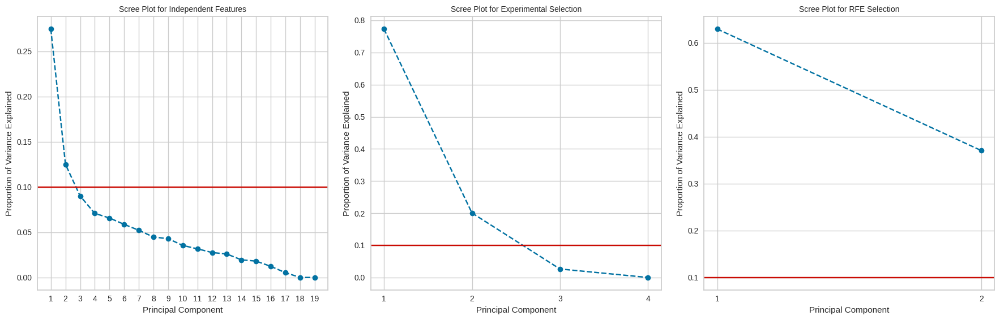

In [34]:
def perform_pca_and_plot(df, features, title_suffix, ax):
    # Perform PCA
    pca = PCA()
    pca.fit(df[features])

    # Calculate the explained variance
    explained_variance = pca.explained_variance_ratio_

    # Plot the scree plot on the provided axes
    ax.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
    ax.set_title(f'Scree Plot for {title_suffix}', fontsize=10)
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('Proportion of Variance Explained')
    ax.axhline(y=0.1, color='r', linestyle='-')
    ax.set_xticks(range(1, len(explained_variance) + 1))
    ax.grid(True)

    # Calculate and print the cumulative variance explained by each number of components
    cumulative_variance = np.cumsum(explained_variance)
    #print(f'Cumulative Variance Explained for {title_suffix}:')
    #for num_components, variance in enumerate(cumulative_variance, start=1):
    #   print(f'{num_components} component{"s" if num_components > 1 else ""}: {variance:.2%}')


feature_sets = {
    'Independent Features': Independent_features,
    'Experimental Selection': selected_features_ex,
    'RFE Selection': selected_features_rfe
}

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Adjusted to three subplots

# Loop through the feature sets and perform PCA
for ax, (title_suffix, features) in zip(axes, feature_sets.items()):
    perform_pca_and_plot(df_train_standrized, features, title_suffix, ax)

plt.tight_layout()
plt.show()


## Machine Learning with defult Hyperparameters:




- ML use all fetures and  Features selection(RFE, ExtracTrees) without KPCA.
- ML use all fetures and  Features selection(RFE, ExtracTrees) with KPCA.



### Polynomial Linear Regression

In [36]:
# Initialize KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=1)

# Initialize the Linear Regression model
linear_regressor = LinearRegression()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_plr = -float('inf')
best_feature_set = None
best_degree = None
best_n_components = None

# List to store results
results = []

# Iterate over each feature set and degree of polynomial without KPCA
for feature_set_name, feature_set in feature_sets.items():
    for degree in range(1, 4):  # Polynomial degrees 1 to 3
        print(f"Evaluating with feature set: {feature_set_name} and degree {degree} (without KPCA)")
        poly = PolynomialFeatures(degree=degree)
        X_poly = poly.fit_transform(df_train_standrized[feature_set])

        r2_scores = cross_val_score(linear_regressor, X_poly, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        results.append({
            'feature_set': feature_set_name,
            'degree': degree,
            'kpca_components': None,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_plr:
            best_r2_train_score_plr = mean_r2
            best_feature_set = feature_set_name
            best_degree = degree
            best_n_components = None

        print(f"Polynomial Linear Regression (Degree {degree}): R² = {mean_r2:.2f}")
        print("---------------------------------------------------------------------------")

# Now, iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for degree in range(1, 5):  # Polynomial degrees 1 to 4
        for n_components in range(2, 8):  # KPCA with components from 2 to 7
            print(f"Evaluating with feature set: {feature_set_name}, degree {degree}, and {n_components} KPCA components")
            poly = PolynomialFeatures(degree=degree)
            X_poly = poly.fit_transform(df_train_standrized[feature_set])
            kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
            X_poly_kpca = kpca.fit_transform(X_poly)

            r2_scores = cross_val_score(linear_regressor, X_poly_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
            mean_r2 = r2_scores.mean()

            # Save result
            results.append({
                'feature_set': feature_set_name,
                'degree': degree,
                'kpca_components': n_components,
                'r2_score': mean_r2
            })

            if mean_r2 > best_r2_train_score_plr:
                best_r2_train_score_plr = mean_r2
                best_feature_set = feature_set_name
                best_degree = degree
                best_n_components = n_components








Evaluating with feature set: Independent_features and degree 1 (without KPCA)
Polynomial Linear Regression (Degree 1): R² = 0.26
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and degree 2 (without KPCA)
Polynomial Linear Regression (Degree 2): R² = -6.23
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and degree 3 (without KPCA)
Polynomial Linear Regression (Degree 3): R² = -6.44
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe and degree 1 (without KPCA)
Polynomial Linear Regression (Degree 1): R² = 0.31
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe and degree 2 (without KPCA)
Polynomial Linear Regression (Degree 2): R² = 0.41
-----------------------------------------------

- Best R² score on the training set: 0.45
- Best feature set: Independent_features
- Best polynomial degree: 1
- Best number of KPCA components: 3

### SVR

In [37]:
# Initialize the SVR model
svr_regressor = SVR()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_svr = -float('inf')
best_feature_set = None
best_n_components = None

# List to store R² results
svr_results = []

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")

    r2_scores = cross_val_score(svr_regressor, df_train_standrized[feature_set], df_train_standrized[Target], cv=kf, scoring='r2')
    mean_r2 = r2_scores.mean()

    # Save result
    svr_results.append({
        'feature_set': feature_set_name,
        'kpca_components': None,
        'r2_score': mean_r2
    })

    if mean_r2 > best_r2_train_score_svr:
        best_r2_train_score_svr = mean_r2
        best_feature_set = feature_set_name
        best_n_components = None

    print(f"SVR: R² = {mean_r2:.2f}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")

        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X_kpca = kpca.fit_transform(df_train_standrized[feature_set])
        r2_scores = cross_val_score(svr_regressor, X_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        svr_results.append({
            'feature_set': feature_set_name,
            'kpca_components': n_components,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_svr:
            best_r2_train_score_svr = mean_r2
            best_feature_set = feature_set_name
            best_n_components = n_components




Evaluating with feature set: Independent_features (without KPCA)
SVR: R² = 0.37
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
SVR: R² = 0.38
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)
SVR: R² = 0.33
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
Evaluating with feature set: Independent_features and 3 KPCA components
Evaluating with feature set: Independent_features and 4 KPCA components
Evaluating with feature set: Independent_features and 5 KPCA components
Evaluating with feature set: Independent_features and 6 KPCA components
Evaluating with feature set: Independent_features and 7 KPCA components
Evaluating with feature set: selected_features_rfe and 2 KPCA components
Evaluating with feature se

- Best R² score on the training set: 0.39
- Best feature set: Independent_features
- Best number of KPCA components: 3

### Random Forest Regressor

In [38]:
# Initialize the Random Forest Regressor model
rf_regressor = RandomForestRegressor()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_rf = -float('inf')
best_feature_set = None
best_n_components = None

# List to store R² results
rf_results = []

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")

    r2_scores = cross_val_score(rf_regressor, df_train_standrized[feature_set], df_train_standrized[Target], cv=kf, scoring='r2')
    mean_r2 = r2_scores.mean()

    # Save result
    rf_results.append({
        'feature_set': feature_set_name,
        'kpca_components': None,
        'r2_score': mean_r2
    })

    if mean_r2 > best_r2_train_score_rf:
        best_r2_train_score_rf = mean_r2
        best_feature_set = feature_set_name
        best_n_components = None

    print(f"Random Forest: R² = {mean_r2:.2f}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA with components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")

        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X_kpca = kpca.fit_transform(df_train_standrized[feature_set])
        r2_scores = cross_val_score(rf_regressor, X_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        rf_results.append({
            'feature_set': feature_set_name,
            'kpca_components': n_components,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_rf:
            best_r2_train_score_rf = mean_r2
            best_feature_set = feature_set_name
            best_n_components = n_components



Evaluating with feature set: Independent_features (without KPCA)
Random Forest: R² = 0.32
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
Random Forest: R² = 0.20
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)
Random Forest: R² = 0.24
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
Evaluating with feature set: Independent_features and 3 KPCA components
Evaluating with feature set: Independent_features and 4 KPCA components
Evaluating with feature set: Independent_features and 5 KPCA components
Evaluating with feature set: Independent_features and 6 KPCA components
Evaluating with feature set: Independent_features and 7 KPCA components
Evaluating with feature set: selected_features_rfe and 2 KPCA compone

- Best R² score on the training set: 0.36
- Best feature set: selected_features_rfe
- Best number of KPCA components: 6

### KNeighborsRegressor

In [39]:
# Initialize the KNeighbors Regressor model
knn_regressor = KNeighborsRegressor()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_knn = -float('inf')
best_feature_set = None
best_n_components = None

# Initialize list to store results
knn_results = []

# Initialize K-Folds
kf = KFold(n_splits=5, shuffle=True, random_state=1)

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")

    r2_scores = cross_val_score(knn_regressor, df_train_standrized[feature_set], df_train_standrized[Target], cv=kf, scoring='r2')
    mean_r2 = r2_scores.mean()

    # Save result
    knn_results.append({
        'feature_set': feature_set_name,
        'kpca_components': None,
        'r2_score': mean_r2
    })

    if mean_r2 > best_r2_train_score_knn:
        best_r2_train_score_knn = mean_r2
        best_feature_set = feature_set_name
        best_n_components = None

    print(f"KNN Regressor: R² = {mean_r2:.2f}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA with components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")

        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X_kpca = kpca.fit_transform(df_train_standrized[feature_set])
        r2_scores = cross_val_score(knn_regressor, X_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        knn_results.append({
            'feature_set': feature_set_name,
            'kpca_components': n_components,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_knn:
            best_r2_train_score_knn = mean_r2
            best_feature_set = feature_set_name
            best_n_components = n_components




Evaluating with feature set: Independent_features (without KPCA)
KNN Regressor: R² = 0.26
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
KNN Regressor: R² = 0.29
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)
KNN Regressor: R² = 0.13
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
Evaluating with feature set: Independent_features and 3 KPCA components
Evaluating with feature set: Independent_features and 4 KPCA components
Evaluating with feature set: Independent_features and 5 KPCA components
Evaluating with feature set: Independent_features and 6 KPCA components
Evaluating with feature set: Independent_features and 7 KPCA components
Evaluating with feature set: selected_features_rfe and 2 KPCA compone

- Best R² score on the training set: 0.30
- Best feature set: Independent_features
- Best number of KPCA components: 4

### Gradient Boosting Regressor

In [40]:
# Initialize the Gradient Boosting Regressor model
gbr_regressor = GradientBoostingRegressor()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_gbr = -float('inf')
best_feature_set = None
best_n_components = None

# Initialize list to store results
gbr_results = []

# K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=1)

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")

    r2_scores = cross_val_score(gbr_regressor, df_train_standrized[feature_set], df_train_standrized[Target], cv=kf, scoring='r2')
    mean_r2 = r2_scores.mean()

    # Save result
    gbr_results.append({
        'feature_set': feature_set_name,
        'kpca_components': None,
        'r2_score': mean_r2
    })

    if mean_r2 > best_r2_train_score_gbr:
        best_r2_train_score_gbr = mean_r2
        best_feature_set = feature_set_name
        best_n_components = None

    print(f"Gradient Boosting Regressor: R² = {mean_r2:.2f}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA with components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")

        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X_kpca = kpca.fit_transform(df_train_standrized[feature_set])
        r2_scores = cross_val_score(gbr_regressor, X_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        gbr_results.append({
            'feature_set': feature_set_name,
            'kpca_components': n_components,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_gbr:
            best_r2_train_score_gbr = mean_r2
            best_feature_set = feature_set_name
            best_n_components = n_components

        print(f"Gradient Boosting Regressor with KPCA ({n_components} components): R² = {mean_r2:.2f}")
        print("---------------------------------------------------------------------------")



Evaluating with feature set: Independent_features (without KPCA)
Gradient Boosting Regressor: R² = 0.24
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
Gradient Boosting Regressor: R² = 0.11
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)
Gradient Boosting Regressor: R² = 0.09
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
Gradient Boosting Regressor with KPCA (2 components): R² = 0.12
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 3 KPCA components
Gradient Boosting Regressor with KPCA (3 components): R² = 0.27
---------------------------------------------------------------------------
Evaluating with feature set: Indepe

- Best R² score on the training set: 0.29
- Best feature set: selected_features_rfe
- Best number of KPCA components: 7

### ANN

In [41]:
# Initialize the MLPRegressor model
mlp_regressor = MLPRegressor(random_state=1, max_iter=1000)

# Initialize variables to track the best scores and parameters
best_r2_train_score_ann = -float('inf')
best_feature_set = None
best_n_components = None

# Initialize list to store results
mlp_results = []

# K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=1)

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")

    r2_scores = cross_val_score(mlp_regressor, df_train_standrized[feature_set], df_train_standrized[Target], cv=kf, scoring='r2')
    mean_r2 = r2_scores.mean()

    # Save result
    mlp_results.append({
        'feature_set': feature_set_name,
        'kpca_components': None,
        'r2_score': mean_r2
    })

    if mean_r2 > best_r2_train_score_ann:
        best_r2_train_score_ann = mean_r2
        best_feature_set = feature_set_name
        best_n_components = None

    print(f"MLPRegressor: R² = {mean_r2:.2f}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA with components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")

        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X_kpca = kpca.fit_transform(df_train_standrized[feature_set])
        r2_scores = cross_val_score(mlp_regressor, X_kpca, df_train_standrized[Target], cv=kf, scoring='r2')
        mean_r2 = r2_scores.mean()

        # Save result
        mlp_results.append({
            'feature_set': feature_set_name,
            'kpca_components': n_components,
            'r2_score': mean_r2
        })

        if mean_r2 > best_r2_train_score_ann:
            best_r2_train_score_ann = mean_r2
            best_feature_set = feature_set_name
            best_n_components = n_components






Evaluating with feature set: Independent_features (without KPCA)
MLPRegressor: R² = 0.15
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
MLPRegressor: R² = 0.36
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor: R² = 0.26
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
Evaluating with feature set: Independent_features and 3 KPCA components
Evaluating with feature set: Independent_features and 4 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: Independent_features and 5 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: Independent_features and 6 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: Independent_features and 7 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: selected_features_rfe and 2 KPCA components
Evaluating with feature set: selected_features_rfe and 3 KPCA components
Evaluating with feature set: selected_features_rfe and 4 KPCA components
Evaluating with feature set: selected_features_rfe and 5 KPCA components
Evaluating with feature set: selected_features_rfe and 6 KPCA components
Evaluating with feature set: selected_features_rfe and 7 KPCA components
Evaluating with feature set: selected_features_ex and 2 KPCA components
Evaluating with feature set: selected_features_ex and 3 KPCA components
Evaluating with feature set: selected_features_ex and 4 KPCA components
Evaluating with feature set: selected_features_ex and 5 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: selected_features_ex and 6 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluating with feature set: selected_features_ex and 7 KPCA components


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


- Best R² score on the training set: 0.44
- Best feature set: Independent_features
- Best number of KPCA components: 3

### Result:

<ipython-input-42-cbbcd5d17175>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=results_df, x='model', y='r2_score', palette='Set2')


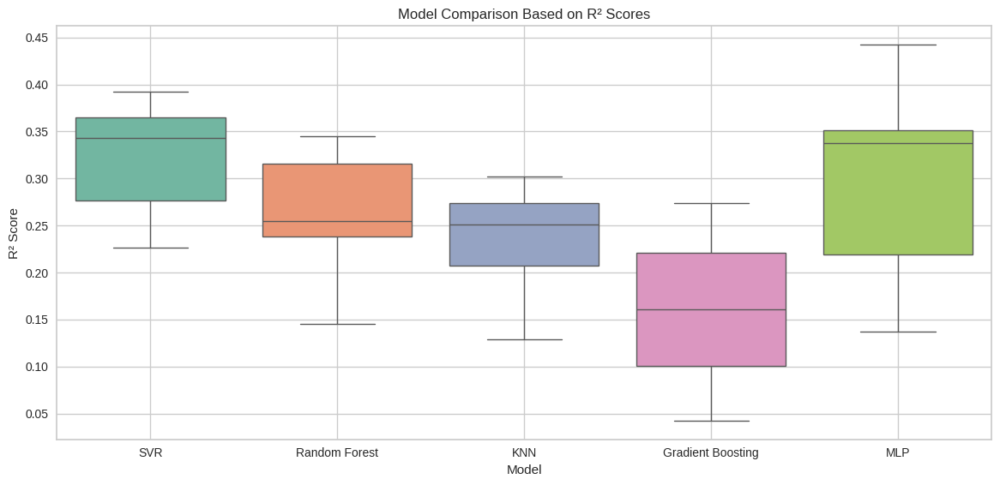

In [42]:
# Combine all results into a single DataFrame
all_results = []

# Add model name to each entry
for result in svr_results:
    result['model'] = 'SVR'
    all_results.append(result)

for result in rf_results:
    result['model'] = 'Random Forest'
    all_results.append(result)

for result in knn_results:
    result['model'] = 'KNN'
    all_results.append(result)

for result in gbr_results:
    result['model'] = 'Gradient Boosting'
    all_results.append(result)

for result in mlp_results:
    result['model'] = 'MLP'
    all_results.append(result)

# Convert to DataFrame
results_df = pd.DataFrame(all_results)

# Create boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(data=results_df, x='model', y='r2_score', palette='Set2')
plt.title('Model Comparison Based on R² Scores')
plt.ylabel('R² Score')
plt.xlabel('Model')
plt.grid(True)
plt.tight_layout()
plt.show()


## Machine Learning with hyperprameter tuning (Optimization)








### Ploynomial Linear Regression

In [51]:
# Define the feature sets
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Define the pipeline with placeholders for KPCA, PolynomialFeatures, and LinearRegression
pipeline_poly = Pipeline([
    ('kpca', KernelPCA()),  # KPCA step
    ('poly', PolynomialFeatures()),  # Polynomial features step
    ('linear', LinearRegression())   # Linear regression step
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'kpca__n_components': [1,2, 3, 4],  # Number of components for KPCA
    'kpca__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Different kernel types for KPCA
    'poly__degree': [1, 2, 3, 4],  # Degree of the polynomial features
    'poly__interaction_only': [True, False],  # Whether to include only interaction features
    'poly__include_bias': [True, False],  # Whether to include a bias column (the intercept)
}

# Initialize variables to track the best scores and parameters
best_score_plr2 = float('-inf')  # R-squared is better when it's higher, so start with -inf
best_params = None
best_feature_set = None

# Iterate over each feature set
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating feature set: {feature_set_name}")

    # Standardize the feature set
    X = df_train_standrized[feature_set]
    y = df_train_standrized[Target]

    # Create GridSearchCV object
    grid_search = GridSearchCV(pipeline_poly, param_grid, cv=kf, scoring='r2', n_jobs=-1)

    # Fit the GridSearchCV object
    grid_search.fit(X, y)

    # Get the best score and parameters
    if grid_search.best_score_ > best_score_plr2:
        best_score_plr2 = grid_search.best_score_
        best_params = grid_search.best_params_
        best_feature_set = feature_set_name

    # Output the current best results
    print(f"Best R-squared score for {feature_set_name}: {grid_search.best_score_:.4f}")
    print(f"Best parameters: {grid_search.best_params_}")
    print("---------------------------------------------------------------------------")

# Print the best results across all feature sets
print(f"Overall best R-squared score: {best_score_plr2:.4f}")
print(f"Best feature set: {best_feature_set}")
print(f"Best parameters: {best_params}")


Evaluating feature set: Independent_features
Best R-squared score for Independent_features: 0.4677
Best parameters: {'kpca__kernel': 'sigmoid', 'kpca__n_components': 2, 'poly__degree': 3, 'poly__include_bias': False, 'poly__interaction_only': False}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_rfe
Best R-squared score for selected_features_rfe: 0.4309
Best parameters: {'kpca__kernel': 'sigmoid', 'kpca__n_components': 2, 'poly__degree': 2, 'poly__include_bias': True, 'poly__interaction_only': False}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_ex
Best R-squared score for selected_features_ex: 0.4054
Best parameters: {'kpca__kernel': 'poly', 'kpca__n_components': 4, 'poly__degree': 1, 'poly__include_bias': True, 'poly__interaction_only': True}
---------------------------------------------------------------------------
Overall best R-squared sco

**Bulid poly model from the best premeters**

In [70]:
# Use the best feature set and parameters
X_final_poly = df_train_standrized[Independent_features]
y_final_poly = df_train_standrized[Target]

# Best parameters found
best_params = {
    'kpca__n_components': 2,
    'kpca__kernel': 'linear',
    'poly__degree': 3,
    'poly__include_bias': False,
    'poly__interaction_only': False
}

# Create the pipeline with the best parameters for polynomial regression
final_pipeline_poly = Pipeline([
    ('kpca', KernelPCA(
        n_components=best_params['kpca__n_components'],
        kernel=best_params['kpca__kernel'],
        random_state=1
    )),
    ('poly', PolynomialFeatures(
        degree=best_params['poly__degree'],
        interaction_only=best_params['poly__interaction_only'],
        include_bias=best_params['poly__include_bias']
    )),
    ('linear', LinearRegression())
])

# Fit the final model with the entire dataset
final_pipeline_poly.fit(X_final_poly, y_final_poly)




Pipeline(steps=[('kpca', KernelPCA(n_components=2, random_state=1)),
                ('poly', PolynomialFeatures(degree=3, include_bias=False)),
                ('linear', LinearRegression())])

#### Use the best feature set and parameters model with testing dataset:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


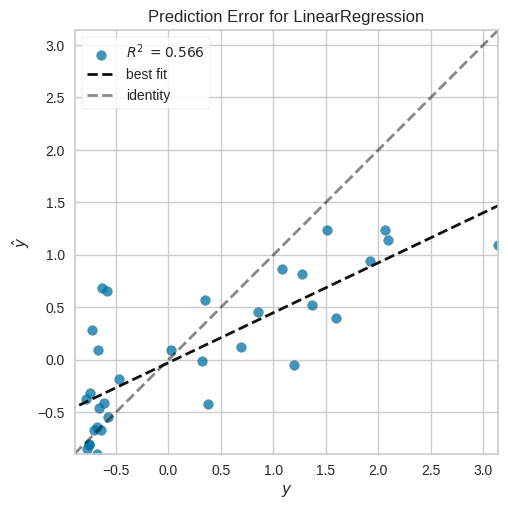

R² Score: 0.5656131669408462
Correlation Coefficient: 0.7872807763199301


In [71]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_poly)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[Independent_features], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[Independent_features], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_poly = r2_score(df_test_standrized[Target], final_pipeline_poly.predict(df_test_standrized[Independent_features]))
print(f'R² Score: {r2_poly}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_poly = np.corrcoef(df_test_standrized[Target], final_pipeline_poly.predict(df_test_standrized[Independent_features]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_poly}')


### SVR Support Vactor Regression

In [55]:
# Initialize the SVR model
svr_regressor = SVR()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Define the parameter distribution for RandomizedSearchCV
svr_param_dist = {
    'svr__kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'svr__epsilon': np.arange(0.00, 0.101, 0.001),
    'svr__C': np.arange(0, 151, 1),
    'kpca__n_components': [2, 3, 4, 5, 6, 7,8],
    'kpca__kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

# Define the pipeline with placeholders for KPCA and SVR
pipeline_svr = Pipeline([
    ('kpca', KernelPCA(random_state=1)),  # KPCA step, initially included
    ('svr', svr_regressor)  # SVR step
])

# Initialize variables to track the best scores and parameters
best_r2_train_score_svr2 = -float('inf')  # Renamed variable
best_feature_set = None
best_n_components = None
best_params = None

# Iterate over each feature set
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name}")

    # Perform RandomizedSearchCV on the pipeline
    svr_search = RandomizedSearchCV(pipeline_svr, svr_param_dist, cv=kf, scoring='r2', n_jobs=-1, n_iter=100, random_state=1)
    svr_search.fit(df_train_standrized[feature_set], df_train_standrized[Target])

    # Check if this is the best R² score so far
    if svr_search.best_score_ > best_r2_train_score_svr2:
        best_r2_train_score_svr2 = svr_search.best_score_
        best_feature_set = feature_set_name
        best_params = svr_search.best_params_

    print(f"Best R² = {svr_search.best_score_:.2f}")
    print(f"Best Parameters: {svr_search.best_params_}")
    print("---------------------------------------------------------------------------")

# Print the best results
print(f"Best R² score on the training set: {best_r2_train_score_svr2:.2f}")  # Updated variable name
print(f"Best feature set: {best_feature_set}")
print(f"Best SVR parameters: {best_params}")


Evaluating with feature set: Independent_features
Best R² = 0.44
Best Parameters: {'svr__kernel': 'linear', 'svr__epsilon': np.float64(0.059000000000000004), 'svr__C': np.int64(127), 'kpca__n_components': 3, 'kpca__kernel': 'rbf'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe
Best R² = 0.35
Best Parameters: {'svr__kernel': 'rbf', 'svr__epsilon': np.float64(0.08600000000000001), 'svr__C': np.int64(64), 'kpca__n_components': 4, 'kpca__kernel': 'linear'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex
Best R² = 0.35
Best Parameters: {'svr__kernel': 'linear', 'svr__epsilon': np.float64(0.075), 'svr__C': np.int64(116), 'kpca__n_components': 5, 'kpca__kernel': 'poly'}
---------------------------------------------------------------------------
Best R² score on the training set: 0.44
Best feature set: Independent_features
Best SVR parame

**Bulid SVR model from the best training R2 Score**

In [72]:
# Assuming best_params is a dictionary containing the best parameters for the model
best_params = {
    'svr__kernel': 'linear',
    'svr__epsilon': 0.059000000000000004,
    'svr__C': 127,
    'kpca__n_components': 3,
    'kpca__kernel': 'rbf'
}

# Extract features and target from the standardized dataset
X_final_svr = df_train_standrized[Independent_features]
y_final_svr = df_train_standrized[Target]

# Create the pipeline with the best parameters for SVR
final_pipeline_svr = Pipeline([
    ('kpca', KernelPCA(
        n_components=best_params['kpca__n_components'],
        kernel=best_params['kpca__kernel'],
        random_state=1
    )),
    ('svr', SVR(
        kernel=best_params['svr__kernel'],
        C=best_params['svr__C'],
        epsilon=best_params['svr__epsilon']
    ))
])

# Fit the final model with the entire dataset
final_pipeline_svr.fit(X_final_svr, y_final_svr)

Pipeline(steps=[('kpca',
                 KernelPCA(kernel='rbf', n_components=3, random_state=1)),
                ('svr',
                 SVR(C=127, epsilon=0.059000000000000004, kernel='linear'))])

#### Use the best feature set and parameters model with testing dataset:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


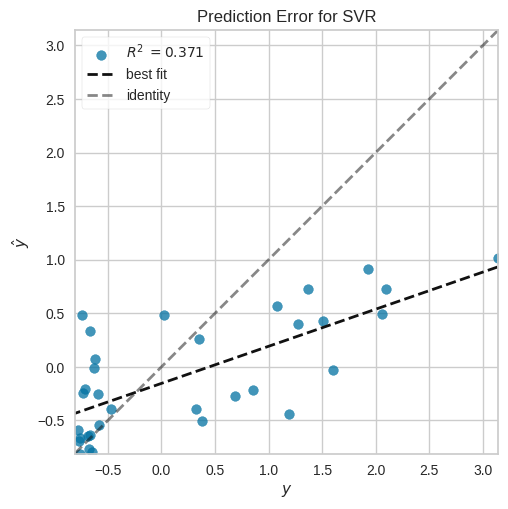

R² Score: 0.37065763006375274
Correlation Coefficient: 0.7090616796721567


In [73]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_svr)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[Independent_features], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[Independent_features], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_svr = r2_score(df_test_standrized[Target], final_pipeline_svr.predict(df_test_standrized[Independent_features]))
print(f'R² Score: {r2_svr}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_svr = np.corrcoef(df_test_standrized[Target], final_pipeline_svr.predict(df_test_standrized[Independent_features]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_svr}')



### Random Forest Regressor

In [59]:
# Initialize the Random Forest Regressor model
rf_regressor = RandomForestRegressor()

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Define the parameter distribution for RandomizedSearchCV
rf_param_dist = {
    'rf__n_estimators': [50, 100, 150, 200, 250],  # Number of trees in the forest
    'rf__max_depth': [3, 6, 9, 12],  # Maximum depth of the tree
    'rf__min_samples_leaf': [1, 2, 3, 4],  # Minimum number of samples required to be at a leaf node
    'rf__min_samples_split': [2, 4, 6, 8],  # Minimum number of samples required to split an internal node
    'rf__max_leaf_nodes': [ 5, 10, 15, 20],  # Maximum number of leaf nodes
    'kpca__n_components': [2, 3, 4, 5, 6, 7,8],  # Adding None to test without KPCA
    'kpca__kernel': ['linear', 'poly', 'rbf', 'sigmoid']  # KPCA kernels
}

# Define the pipeline with placeholders for KPCA and RF
pipeline_rf = Pipeline([
    ('kpca', KernelPCA(random_state=1)),  # KPCA step
    ('rf', rf_regressor)  # Random Forest Regressor step
])

# Initialize variables to track the best scores and parameters
best_r2_train_score_rf = -float('inf')
best_feature_set = None
best_n_components = None
best_params = None

# Iterate over each feature set
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name}")

    # Perform RandomizedSearchCV on the pipeline
    rf_search = RandomizedSearchCV(pipeline_rf, rf_param_dist, cv=kf, scoring='r2', n_jobs=-1, n_iter=100, random_state=1)
    rf_search.fit(df_train_standrized[feature_set], df_train_standrized[Target])

    # Check if this is the best R² score so far
    if rf_search.best_score_ > best_r2_train_score_rf:
        best_r2_train_score_rf = rf_search.best_score_
        best_feature_set = feature_set_name
        best_params = rf_search.best_params_

    print(f"Best R² = {rf_search.best_score_:.2f}")
    print(f"Best Parameters: {rf_search.best_params_}")
    print("---------------------------------------------------------------------------")

# Print the best results
print(f"Best R² score on the training set: {best_r2_train_score_rf:.2f}")
print(f"Best feature set: {best_feature_set}")
print(f"Best RF parameters: {best_params}")


Evaluating with feature set: Independent_features
Best R² = 0.46
Best Parameters: {'rf__n_estimators': 50, 'rf__min_samples_split': 8, 'rf__min_samples_leaf': 1, 'rf__max_leaf_nodes': 5, 'rf__max_depth': 3, 'kpca__n_components': 2, 'kpca__kernel': 'linear'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe
Best R² = 0.42
Best Parameters: {'rf__n_estimators': 250, 'rf__min_samples_split': 4, 'rf__min_samples_leaf': 4, 'rf__max_leaf_nodes': 15, 'rf__max_depth': 12, 'kpca__n_components': 6, 'kpca__kernel': 'poly'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex
Best R² = 0.36
Best Parameters: {'rf__n_estimators': 150, 'rf__min_samples_split': 4, 'rf__min_samples_leaf': 1, 'rf__max_leaf_nodes': 10, 'rf__max_depth': 12, 'kpca__n_components': 5, 'kpca__kernel': 'rbf'}
------------------------------------------------------------------------

**Bulid RF model from the best prameters**

In [60]:
# Set the best feature set and target
X_final = df_train_standrized[Independent_features]
y_final = df_train_standrized[Target]

# Create the pipeline with the best parameters
final_pipeline_rf = Pipeline([
    ('kpca', KernelPCA(n_components=2, kernel='linear', random_state=1)),
    ('rf', RandomForestRegressor(
        n_estimators=50,
        min_samples_split=8,
        min_samples_leaf=1,
        max_leaf_nodes=5,
        max_depth=3,
        random_state=1
    ))
])

# Fit the final model with the entire dataset
final_pipeline_rf.fit(X_final, y_final)



Pipeline(steps=[('kpca', KernelPCA(n_components=2, random_state=1)),
                ('rf',
                 RandomForestRegressor(max_depth=3, max_leaf_nodes=5,
                                       min_samples_split=8, n_estimators=50,
                                       random_state=1))])

#### Use the best feature set and parameters model with testing dataset:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


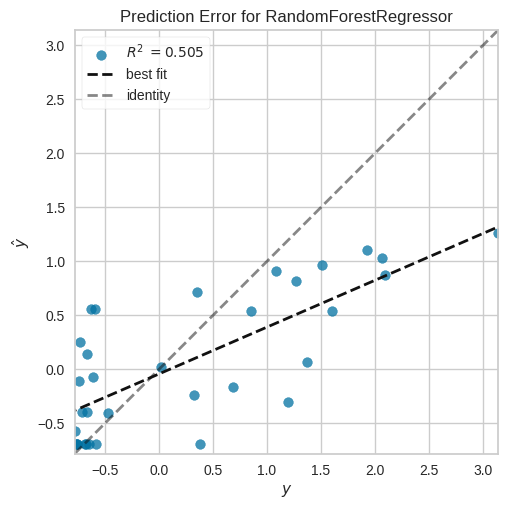

R² Score: 0.504819667765109
Correlation Coefficient: 0.7502355958836671


In [61]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_rf)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[Independent_features], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[Independent_features], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_rf = r2_score(df_test_standrized[Target], final_pipeline_rf.predict(df_test_standrized[Independent_features]))
print(f'R² Score: {r2_rf}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_rf = np.corrcoef(df_test_standrized[Target], final_pipeline_rf.predict(df_test_standrized[Independent_features]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_rf}')



### KNeighborsRegressor

In [76]:
# Initialize the KNeighbors Regressor model
knn_regressor = KNeighborsRegressor()

# Hyperparameter grid to search
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 15],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [20, 30, 40, 50],
    'p': [1, 2]  # 1 for Manhattan, 2 for Euclidean distance
}

# List of feature sets to iterate through
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Initialize variables to track the best scores and parameters
best_r2_train_score_knn = -float('inf')
best_feature_set = None
best_n_components = None
best_params = None

# Initialize K-Folds
kf = KFold(n_splits=5, shuffle=True, random_state=1)

# Function to perform GridSearchCV and evaluate the model
def evaluate_knn(X, y, params, use_kpca=False, n_components=None):
    if use_kpca:
        kpca = KernelPCA(n_components=n_components, kernel='rbf', random_state=1)
        X = kpca.fit_transform(X)

    grid_search = GridSearchCV(KNeighborsRegressor(), param_grid=params, cv=kf, scoring='r2', n_jobs=-1)
    grid_search.fit(X, y)
    return grid_search.best_score_, grid_search.best_params_

# Iterate over each feature set without KPCA
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating with feature set: {feature_set_name} (without KPCA)")
    score, params = evaluate_knn(df_train_standrized[feature_set], df_train_standrized[Target], param_grid)
    if score > best_r2_train_score_knn:
        best_r2_train_score_knn = score
        best_feature_set = feature_set_name
        best_n_components = None  # No KPCA applied
        best_params = params

    print(f"KNN Regressor: R² = {score:.2f}, Params: {params}")
    print("---------------------------------------------------------------------------")

# Iterate over each feature set with KPCA
for feature_set_name, feature_set in feature_sets.items():
    for n_components in range(2, 8):  # KPCA with components from 2 to 7
        print(f"Evaluating with feature set: {feature_set_name} and {n_components} KPCA components")
        score, params = evaluate_knn(df_train_standrized[feature_set], df_train_standrized[Target], param_grid, use_kpca=True, n_components=n_components)
        if score > best_r2_train_score_knn:
            best_r2_train_score_knn = score
            best_feature_set = feature_set_name
            best_n_components = n_components
            best_params = params

        print(f"KNN Regressor with KPCA ({n_components} components): R² = {score:.2f}, Params: {params}")
        print("---------------------------------------------------------------------------")

# Print the best results
print(f"Best R² score on the training set: {best_r2_train_score_knn:.2f}")
print(f"Best feature set: {best_feature_set}")
print(f"Best number of KPCA components: {best_n_components}")
print(f"Best hyperparameters: {best_params}")


Evaluating with feature set: Independent_features (without KPCA)
KNN Regressor: R² = 0.33, Params: {'algorithm': 'ball_tree', 'leaf_size': 20, 'n_neighbors': 15, 'p': 2, 'weights': 'distance'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_rfe (without KPCA)
KNN Regressor: R² = 0.35, Params: {'algorithm': 'brute', 'leaf_size': 20, 'n_neighbors': 15, 'p': 2, 'weights': 'distance'}
---------------------------------------------------------------------------
Evaluating with feature set: selected_features_ex (without KPCA)
KNN Regressor: R² = 0.29, Params: {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 15, 'p': 1, 'weights': 'distance'}
---------------------------------------------------------------------------
Evaluating with feature set: Independent_features and 2 KPCA components
KNN Regressor with KPCA (2 components): R² = 0.38, Params: {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 15, 'p': 1, 'wei

**Bulid KNR model from the best prameters**

In [77]:
# Set the best feature set and target
X_final = df_train_standrized[Independent_features]
y_final = df_train_standrized[Target]

# Create the pipeline with the best parameters
final_pipeline_knr = Pipeline([
    ('kpca', KernelPCA(n_components=7, kernel='rbf', random_state=1)),
    ('knr', KNeighborsRegressor(
        algorithm='auto',
        leaf_size=20,
        n_neighbors=15,
        p=1,
        weights='uniform'
    ))
])

# Fit the final model with the entire dataset
final_pipeline_knr.fit(X_final, y_final)


Pipeline(steps=[('kpca',
                 KernelPCA(kernel='rbf', n_components=7, random_state=1)),
                ('knr',
                 KNeighborsRegressor(leaf_size=20, n_neighbors=15, p=1))])

#### Use the best feature set and parameters model with testing dataset:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


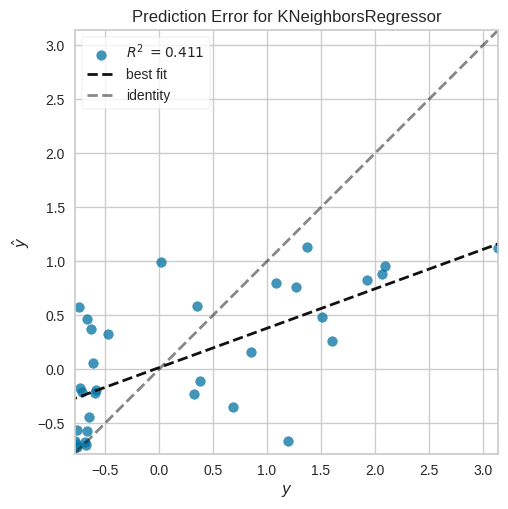

R² Score: 0.4110271557902794
Correlation Coefficient: 0.6645380313222667


In [78]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_knr)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[Independent_features], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[Independent_features], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_knr = r2_score(df_test_standrized[Target], final_pipeline_knr.predict(df_test_standrized[Independent_features]))
print(f'R² Score: {r2_knr}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_knr = np.corrcoef(df_test_standrized[Target], final_pipeline_knr.predict(df_test_standrized[Independent_features]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_knr}')



### Gradient Boosting Regressor

In [79]:
# Define the feature sets
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Define the pipeline with placeholders for KPCA and GradientBoostingRegressor
pipeline_gbr = Pipeline([
    ('kpca', KernelPCA()),  # KPCA step
    ('gbr', GradientBoostingRegressor(random_state=1))   # Gradient Boosting Regressor step
])

# Define the parameter distribution for RandomizedSearchCV
param_distributions = {
    'kpca__n_components': [2, 3, 4,5,6,7,8],  # Number of components for KPCA
    'kpca__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Different kernel types for KPCA
    'gbr__n_estimators': np.arange(50, 201, 50),  # Number of boosting stages
    'gbr__max_depth': np.arange(3, 10, 3),  # Maximum depth of the individual estimators
    'gbr__min_samples_split': np.arange(2, 7, 2),  # Minimum number of samples required to split a node
    'gbr__min_samples_leaf': np.arange(1, 4),  # Minimum number of samples required to be at a leaf node
    'gbr__learning_rate': [0.01, 0.05, 0.1],  # Learning rate
    'gbr__max_features': ['sqrt', 'log2'],  # Number of features to consider when looking for the best split
}

# Initialize variables to track the best scores and parameters
best_score_gbr = float('-inf')  # R-squared is better when it's higher, so start with -inf
best_params = None
best_feature_set = None

# Iterate over each feature set
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating feature set: {feature_set_name}")

    # Standardize the feature set
    X = df_train_standrized[feature_set]
    y = df_train_standrized[Target]

    # Create RandomizedSearchCV object
    random_search = RandomizedSearchCV(pipeline_gbr, param_distributions, cv=kf, scoring='r2', n_iter=100, n_jobs=-1, random_state=1)

    # Fit the RandomizedSearchCV object
    random_search.fit(X, y)

    # Get the best score and parameters
    if random_search.best_score_ > best_score_gbr:
        best_score_gbr = random_search.best_score_
        best_params = random_search.best_params_
        best_feature_set = feature_set_name

    # Output the current best results
    print(f"Best R-squared score for {feature_set_name}: {random_search.best_score_:.4f}")
    print(f"Best parameters: {random_search.best_params_}")
    print("---------------------------------------------------------------------------")

# Print the best results across all feature sets
print(f"Overall best R-squared score: {best_score_gbr:.4f}")
print(f"Best feature set: {best_feature_set}")
print(f"Best parameters: {best_params}")


Evaluating feature set: Independent_features
Best R-squared score for Independent_features: 0.4198
Best parameters: {'kpca__n_components': 5, 'kpca__kernel': 'linear', 'gbr__n_estimators': np.int64(200), 'gbr__min_samples_split': np.int64(4), 'gbr__min_samples_leaf': np.int64(1), 'gbr__max_features': 'log2', 'gbr__max_depth': np.int64(3), 'gbr__learning_rate': 0.05}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_rfe
Best R-squared score for selected_features_rfe: 0.4493
Best parameters: {'kpca__n_components': 8, 'kpca__kernel': 'poly', 'gbr__n_estimators': np.int64(50), 'gbr__min_samples_split': np.int64(6), 'gbr__min_samples_leaf': np.int64(1), 'gbr__max_features': 'sqrt', 'gbr__max_depth': np.int64(3), 'gbr__learning_rate': 0.05}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_ex
Best R-squared score for selected_features_ex: 0.3751
Best paramet

**Bulid GB model with the best premeters**

In [83]:
# Assuming df_train_standrized and Target have been previously defined
X_final = df_train_standrized[selected_features_rfe]  # Using the best feature set
y_final = df_train_standrized[Target]

# Define the best parameters
best_params = {
    'kpca__n_components': 8,
    'kpca__kernel': 'poly',
    'gbr__n_estimators': 50,
    'gbr__min_samples_split': 6,
    'gbr__min_samples_leaf': 1,
    'gbr__max_features': 'sqrt',
    'gbr__max_depth': 3,
    'gbr__learning_rate': 0.05
}

# Create the pipeline with the best parameters for Gradient Boosting Regressor
final_pipeline_gbr = Pipeline([
    ('kpca', KernelPCA(n_components=best_params['kpca__n_components'], kernel=best_params['kpca__kernel'], random_state=1)),
    ('gbr', GradientBoostingRegressor(
        n_estimators=best_params['gbr__n_estimators'],
        max_depth=best_params['gbr__max_depth'],
        min_samples_leaf=best_params['gbr__min_samples_leaf'],
        min_samples_split=best_params['gbr__min_samples_split'],
        learning_rate=best_params['gbr__learning_rate'],
        max_features=best_params['gbr__max_features'],
        random_state=1
    ))
])

# Fit the final model with the entire dataset
final_pipeline_gbr.fit(X_final, y_final)



Pipeline(steps=[('kpca',
                 KernelPCA(kernel='poly', n_components=8, random_state=1)),
                ('gbr',
                 GradientBoostingRegressor(learning_rate=0.05,
                                           max_features='sqrt',
                                           min_samples_split=6, n_estimators=50,
                                           random_state=1))])

#### Use the best feature set and parameters model with testing dataset:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


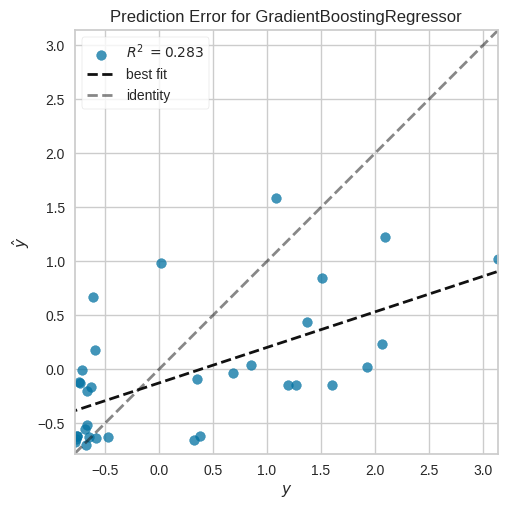

R² Score: 0.2834507496774029
Correlation Coefficient: 0.5978433858424815


In [84]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_gbr)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[selected_features_rfe], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[selected_features_rfe], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_gbr = r2_score(df_test_standrized[Target], final_pipeline_gbr.predict(df_test_standrized[selected_features_rfe]))
print(f'R² Score: {r2_gbr}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_gbr = np.corrcoef(df_test_standrized[Target], final_pipeline_gbr.predict(df_test_standrized[selected_features_rfe]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_gbr}')




### ANN

In [87]:
# Define the feature sets
feature_sets = {
    'Independent_features': Independent_features,
    'selected_features_rfe': selected_features_rfe,
    'selected_features_ex': selected_features_ex,
}

# Define the pipeline with placeholders for KPCA and MLPRegressor
pipeline_mlp = Pipeline([
    ('kpca', KernelPCA()),  # KPCA step
    ('mlp', MLPRegressor(random_state=1, max_iter=100))   # MLP Regressor step
])

# Define the parameter distribution for RandomizedSearchCV
param_distributions = {
    'kpca__n_components': [1,2, 3, 4,5,6,7,8],  # Number of components for KPCA
    'kpca__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Different kernel types for KPCA
    'mlp__hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],  # Different layer sizes for MLP
    'mlp__activation': ['relu', 'tanh', 'logistic'],  # Activation functions
    'mlp__solver': ['adam', 'lbfgs'],  # Solvers
    'mlp__alpha': [0.0001, 0.001, 0.01],  # Regularization parameter
    'mlp__learning_rate_init': [0.001, 0.01, 0.1],  # Initial learning rate
    'mlp__learning_rate': ['constant', 'adaptive'],  # Learning rate schedule
}

# Initialize variables to track the best scores and parameters
best_score_mlp = float('-inf')
best_params = None
best_feature_set = None

# Iterate over each feature set
for feature_set_name, feature_set in feature_sets.items():
    print(f"Evaluating feature set: {feature_set_name}")

    # Standardize the feature set
    X = df_train_standrized[feature_set]
    y = df_train_standrized[Target]

    # Create RandomizedSearchCV object
    random_search = RandomizedSearchCV(pipeline_mlp, param_distributions, cv=kf, scoring='r2', n_iter=200, n_jobs=-1, random_state=1)

    # Fit the RandomizedSearchCV object
    random_search.fit(X, y)

    # Get the best score and parameters
    if random_search.best_score_ > best_score_mlp:
        best_score_mlp = random_search.best_score_
        best_params = random_search.best_params_
        best_feature_set = feature_set_name

    # Output the current best results
    print(f"Best R-squared score for {feature_set_name}: {random_search.best_score_:.4f}")
    print(f"Best parameters: {random_search.best_params_}")
    print("---------------------------------------------------------------------------")

# Print the best results across all feature sets
print(f"Overall best R-squared score: {best_score_mlp:.4f}")
print(f"Best feature set: {best_feature_set}")
print(f"Best parameters: {best_params}")


Evaluating feature set: Independent_features
Best R-squared score for Independent_features: 0.4338
Best parameters: {'mlp__solver': 'lbfgs', 'mlp__learning_rate_init': 0.001, 'mlp__learning_rate': 'adaptive', 'mlp__hidden_layer_sizes': (50, 50), 'mlp__alpha': 0.0001, 'mlp__activation': 'logistic', 'kpca__n_components': 1, 'kpca__kernel': 'rbf'}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_rfe


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Best R-squared score for selected_features_rfe: 0.3939
Best parameters: {'mlp__solver': 'adam', 'mlp__learning_rate_init': 0.001, 'mlp__learning_rate': 'adaptive', 'mlp__hidden_layer_sizes': (100, 50), 'mlp__alpha': 0.0001, 'mlp__activation': 'relu', 'kpca__n_components': 4, 'kpca__kernel': 'sigmoid'}
---------------------------------------------------------------------------
Evaluating feature set: selected_features_ex
Best R-squared score for selected_features_ex: 0.4026
Best parameters: {'mlp__solver': 'adam', 'mlp__learning_rate_init': 0.01, 'mlp__learning_rate': 'constant', 'mlp__hidden_layer_sizes': (100,), 'mlp__alpha': 0.01, 'mlp__activation': 'logistic', 'kpca__n_components': 6, 'kpca__kernel': 'poly'}
---------------------------------------------------------------------------
Overall best R-squared score: 0.4338
Best feature set: Independent_features
Best parameters: {'mlp__solver': 'lbfgs', 'mlp__learning_rate_init': 0.001, 'mlp__learning_rate': 'adaptive', 'mlp__hidden_laye

**Bulid MLP model with the best premeters**

In [97]:
# Assign the best feature set to the final dataset
X_final_mlp = df_train_standrized[selected_features_ex]
y_final_mlp = df_train_standrized[Target]

# Best parameters provided
best_params = {
    'mlp__solver': 'adam',
    'mlp__learning_rate_init': 0.001,
    'mlp__learning_rate': 'adaptive',
    'mlp__hidden_layer_sizes': (50,50),
    'mlp__alpha': 0.001,
    'mlp__activation': 'tanh',
    'kpca__n_components': 8,
    'kpca__kernel': 'rbf'
}

# Create the pipeline with the best parameters
final_pipeline_mlp = Pipeline([
    ('kpca', KernelPCA(
        n_components=best_params.get('kpca__n_components', 8),  # Use provided value or default
        kernel=best_params.get('kpca__kernel', 'rbf'),
        random_state=1
    )),
    ('mlp', MLPRegressor(
        hidden_layer_sizes=best_params['mlp__hidden_layer_sizes'],
        activation=best_params['mlp__activation'],
        solver=best_params['mlp__solver'],
        alpha=best_params['mlp__alpha'],
        learning_rate_init=best_params['mlp__learning_rate_init'],
        learning_rate=best_params['mlp__learning_rate'],
        max_iter=1000,  # You can increase this if needed for convergence
        random_state=1
    ))
])

# Fit the final MLP model with the entire dataset
final_pipeline_mlp.fit(X_final_mlp, y_final_mlp)


Pipeline(steps=[('kpca',
                 KernelPCA(kernel='rbf', n_components=8, random_state=1)),
                ('mlp',
                 MLPRegressor(activation='tanh', alpha=0.001,
                              hidden_layer_sizes=(50, 50),
                              learning_rate='adaptive', max_iter=1000,
                              random_state=1))])

#### Use the best feature set and parameters model with testing dataset:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


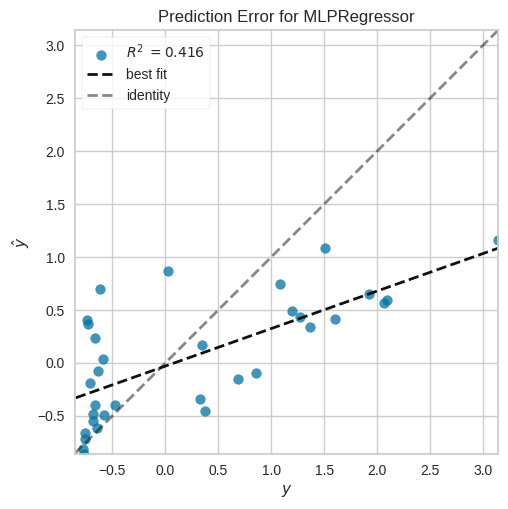

R² Score: 0.41563761747992245
Correlation Coefficient: 0.6918259766889762


In [98]:
# Initialize the PredictionError visualizer with the best model
visualizer = PredictionError(final_pipeline_mlp)

# Fit the visualizer using the transformed testing data
visualizer.fit(df_test_standrized[selected_features_ex], df_test_standrized[Target])

# Evaluate the model on the transformed test data
visualizer.score(df_test_standrized[selected_features_ex], df_test_standrized[Target])

# Show the plot
visualizer.show()

# Calculate and print the R² score
r2_mlp = r2_score(df_test_standrized[Target], final_pipeline_mlp.predict(df_test_standrized[selected_features_ex]))
print(f'R² Score: {r2_mlp}')

# Calculate and print the Correlation Coefficient
correlation_coefficient_mlp = np.corrcoef(df_test_standrized[Target], final_pipeline_mlp.predict(df_test_standrized[selected_features_ex]))[0, 1]
print(f'Correlation Coefficient: {correlation_coefficient_mlp}')


### results

<ipython-input-99-50b0b8f85a45>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='R² Score', data=data, palette='Set2')
<ipython-input-99-50b0b8f85a45>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Correlation Coefficient', data=data, palette='Set3')


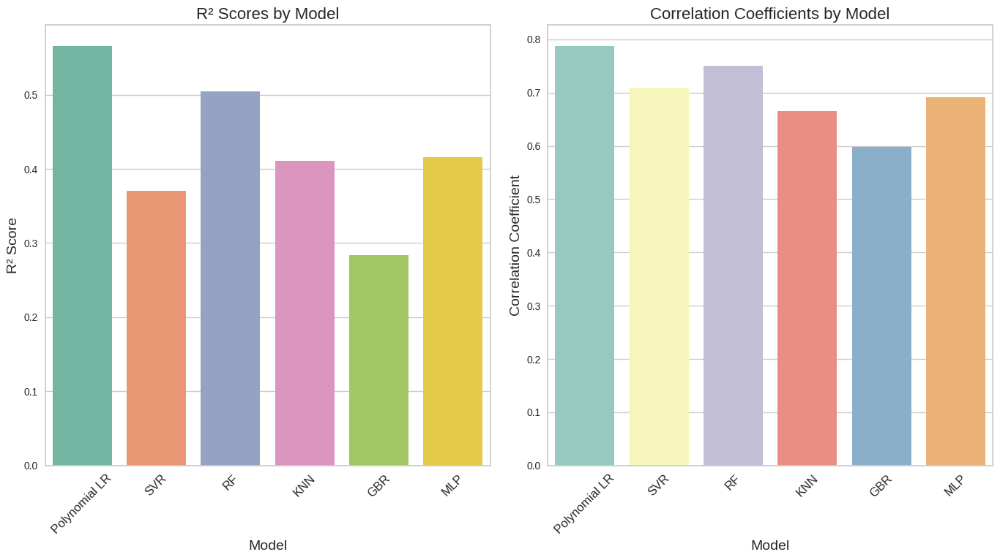

Polynomial LR             R²: 0.57  Correlation Coefficient: 0.79
SVR                       R²: 0.37  Correlation Coefficient: 0.71
RF                        R²: 0.50  Correlation Coefficient: 0.75
KNN                       R²: 0.41  Correlation Coefficient: 0.66
GBR                       R²: 0.28  Correlation Coefficient: 0.60
MLP                       R²: 0.42  Correlation Coefficient: 0.69


In [99]:
# Data preparation
models = ['Polynomial LR', 'SVR', 'RF', 'KNN', 'GBR', 'MLP']
r2_scores = [r2_poly, r2_svr, r2_rf, r2_knr, r2_gbr, r2_mlp]
correlation_coefficients = [correlation_coefficient_poly, correlation_coefficient_svr, correlation_coefficient_rf, correlation_coefficient_knr, correlation_coefficient_gbr, correlation_coefficient_mlp]

# Create a DataFrame
data = pd.DataFrame({
    'Model': models,
    'R² Score': r2_scores,
    'Correlation Coefficient': correlation_coefficients
})

# Plotting side-by-side bar charts
plt.figure(figsize=(14, 8))

# Creating a bar plot for R² Scores
plt.subplot(1, 2, 1)
sns.barplot(x='Model', y='R² Score', data=data, palette='Set2')
plt.title('R² Scores by Model', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.xlabel('Model', fontsize=14)
plt.ylabel('R² Score', fontsize=14)

# Creating a bar plot for Correlation Coefficients
plt.subplot(1, 2, 2)
sns.barplot(x='Model', y='Correlation Coefficient', data=data, palette='Set3')
plt.title('Correlation Coefficients by Model', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Correlation Coefficient', fontsize=14)
plt.tight_layout()
plt.show()

# Print R² scores and Correlation Coefficients
for model, r2, cc in zip(models, r2_scores, correlation_coefficients):
    print(f'{model:<25} R²: {r2:.2f}  Correlation Coefficient: {cc:.2f}')


## Explainable AI (XAI)

### Lime

_ we will use the best ML model training and testing( in our case here in nutrition is Random forest the best but ANN more stable).

##### The highest three countries

In [100]:
# Assuming df_without_Countries_standrized, Independent_features, and Target are defined
X = df_combined_with_countries[Independent_features].to_numpy()
y = df_combined_with_countries[Target].to_numpy()

In [101]:

# Use LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X,
                                                   feature_names=Independent_features,
                                                   class_names=[Target],
                                                   verbose=True,
                                                   mode='regression')

In [105]:
# Explaining the model's predictions
print('The highest three countries:')
for i in range(0, 2):
    explanation = explainer.explain_instance(X[i], final_pipeline_poly.predict)
    country_name = df_combined['Country'].iloc[i]
    display(HTML(f"<strong>Country: {country_name}</strong>"))  # Displaying the country name in bold
    explanation.show_in_notebook(show_table=True)





The highest three countries:
Intercept -0.24109822186810986
Prediction_local [1.31002301]
Right: 1.0901687916639644


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


Intercept -0.17638661055046104
Prediction_local [1.12333647]
Right: 1.1270099448550859


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


In [106]:
# Explaining the model's predictions
print('The highest three countries:')
for i in range(len(X)-2, len(X)):
    explanation = explainer.explain_instance(X[i], final_pipeline_poly.predict)
    country_name = df_combined['Country'].iloc[i]
    display(HTML(f"<strong>Country: {country_name}</strong>"))
    explanation.show_in_notebook(show_table=True)

The highest three countries:
Intercept 0.5972271529942703
Prediction_local [-1.15232668]
Right: -0.7959419948525519


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(


Intercept 0.44786425469013214
Prediction_local [-0.72599893]
Right: -0.3710639803178257


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KernelPCA was fitted with feature names
  warnings.warn(
